<a href="https://colab.research.google.com/github/isaacchunn/SC1015_MiniPrj_Airbnb/blob/main/Airbnb_EDA_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Dataset : Airbnb Singapore Dataset from InsideAirbnb
#### Question : If we were an AirBnb host, how can we maximise our profit?


Dataset from Airbnb : **"Singapore, 29 December 2022"**  
Source: http://insideairbnb.com/get-the-data/


# Contents
  1. Dataset
  2. Univariate EDA
  3. Bivariate EDA
  4. Multivariate EDA


---

### Essential Libraries

Import essential libraries such as numpy, pandas, matplotlib and seaborn.

> NumPy : Library for Numeric Computations in Python  
> Pandas : Library for Data Acquisition and Preparation  
> Matplotlib : Low-level library for Data Visualization  
> Seaborn : Higher-level library for Data Visualization  

In [2]:
# Isaac Chun Jun Heng U2221389B
# J'sen Ong Jia Xuan  U2220457J
# Tang Teck Meng U2221809C

In [3]:
#Basic libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt #We only need pyplot
sb.set() #Set the default Seaborn style for graphics

### Additional Dependencies

In [4]:
!pip install geopandas
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 24.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 64.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Additional Libraries

Import additional libraries

> Wordcloud : Library to create tag clouds in Python  
> Folium : Plot a map visualization in Python  
> Geopandas : Handle geojson data to generate chloropelth maps
> sklearn : Conduct linear regression analysis

In [5]:
from IPython import display
from sklearn.model_selection import train_test_split
from wordcloud import WordCloud
import folium
import geopandas

### General Utility Functions

In [6]:
def countOutliers (df):
    #Get the q1 and q3 datas to find out the 25% and 75% range, then calculate inter quartile range and then find out whiskers.
    #Then count how many points lie outside of this range.
    q1 = df.quantile(0.25)
    q3 = df.quantile(0.75)
    #Interquartile
    iqr = q3 - q1
    #Calculate whiskers
    leftWhisker = q1 - (1.5 * iqr)
    rightWhisker = q3 + (1.5 * iqr)
    outliers = 0;
    #Loop through data now
    for data in df:
        if(data < leftWhisker or data > rightWhisker):
            outliers+=1

    return outliers

In [7]:
def removeOutliers(df, colName):
  q1 = df[colName].quantile(0.25)
  q3 = df[colName].quantile(0.75)
  iqr = q3-q1
  low = q1 - 1.5 * iqr
  high = q3 + 1.5 * iqr
  result = df.loc[(df[colName] >= low) & (df[colName] <= high)]
  return result

In [8]:
def remove_outliers(df, columns, factor=1.5):
    # loop through each column and remove outliers based on the IQR method
    for col in columns:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        upper_bound = q3 + factor * iqr
        lower_bound = q1 - factor * iqr
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    
    return df

### Mount Google Drive (unused, uncomment if need add anything from google drive.)

In [9]:
# from google.colab import drive 
# drive.mount('/content/gdrive')

#What is Airbnb?

Airbnb, Inc. is an American San Francisco-based company operating an online marketplace for short-term homestays and experiences. The company acts as a broker and charges a commission from each booking. The company was founded in 2008 by Brian Chesky, Nathan Blecharczyk, and Joe Gebbia.




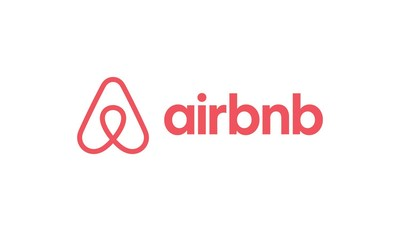

In [10]:
display.Image("https://mma.prnewswire.com/media/1121685/Airbnb_Logo.jpg")

---

>## Hypothesis  

1. The number of amenities a listing provides will affect its price, the more the amenities, the higher the listing price
2. Variables related to a listing's review will have positive correlation to listing's price

---

>## Import the Dataset  

We have imported the cleaned dataset based on our EDA done in the other files.

In [11]:
url = "https://raw.githubusercontent.com/isaacchunn/SC1015_MiniPrj_Airbnb/main/listings_cleaned.csv"
airDF = pd.read_csv(url)
airDF.head()

,name,listing_url,description,neighborhood_overview,host_response_time,host_response_rate,host_acceptance_rate,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,...,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable
0,Ensuite Room (Room 1 & 2) near EXPO,https://www.airbnb.com/rooms/71609,For 3 rooms.Book room 1&2 and room 4<br /><br ...,NaN,within a few hours,90%,100%,Tampines,East Region,1.34537,...,20.0,4.44,4.37,4.00,4.63,4.78,4.26,4.32,NaN,f
1,B&B Room 1 near Airport & EXPO,https://www.airbnb.com/rooms/71896,<b>The space</b><br />Vocational Stay Deluxe B...,NaN,within a few hours,90%,100%,Tampines,East Region,1.34754,...,24.0,4.16,4.22,4.09,4.43,4.43,4.17,4.04,NaN,t
2,Room 2-near Airport & EXPO,https://www.airbnb.com/rooms/71903,"Like your own home, 24hrs access.<br /><br /><...",Quiet and view of the playground with exercise...,within a few hours,90%,100%,Tampines,East Region,1.34531,...,47.0,4.41,4.39,4.52,4.63,4.64,4.50,4.36,NaN,f
3,Amazing Room with window 10min to Redhill,https://www.airbnb.com/rooms/275343,Awesome location and host <br />Room near INSE...,NaN,within an hour,100%,85%,Bukit Merah,Central Region,1.29015,...,22.0,4.40,4.16,4.26,4.47,4.42,4.53,4.63,S0399,f
4,15 mins to Outram MRT Single Room,https://www.airbnb.com/rooms/275344,Lovely home for the special guest !<br /><br /...,Bus stop <br />Food center <br />Supermarket,within an hour,100%,85%,Bukit Merah,Central Region,1.28836,...,14.0,4.50,4.69,4.23,4.62,4.54,4.62,4.46,S0399,f


In [12]:
airDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3035 entries, 0 to 3034
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   name                          3035 non-null   object 
 1   listing_url                   3035 non-null   object 
 2   description                   2968 non-null   object 
 3   neighborhood_overview         1968 non-null   object 
 4   host_response_time            2405 non-null   object 
 5   host_response_rate            2405 non-null   object 
 6   host_acceptance_rate          2284 non-null   object 
 7   neighbourhood_cleansed        3018 non-null   object 
 8   neighbourhood_group_cleansed  3018 non-null   object 
 9   latitude                      3018 non-null   float64
 10  longitude                     3018 non-null   float64
 11  property_type                 3018 non-null   object 
 12  accommodates                  3018 non-null   float64
 13  ame

In [13]:
print(airDF.dtypes)

name                             object
listing_url                      object
description                      object
neighborhood_overview            object
host_response_time               object
host_response_rate               object
host_acceptance_rate             object
neighbourhood_cleansed           object
neighbourhood_group_cleansed     object
latitude                        float64
longitude                       float64
property_type                    object
accommodates                    float64
amenities                        object
price                            object
minimum_nights                  float64
maximum_nights                  float64
number_of_reviews               float64
review_scores_rating            float64
review_scores_accuracy          float64
review_scores_cleanliness       float64
review_scores_checkin           float64
review_scores_communication     float64
review_scores_location          float64
review_scores_value             float64


---

## Potential Variables  
During our EDA, we have cleaned the dataset and identified several variables that might affect the price. It is listed as follows:

1. **host_response_time** : The average response time of the host to messages.
2. **neighbourhood_cleansed** : The neighbourhood as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.
3. **neighbourhood_group_cleansed** : The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.
4. **property_type** : Self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field
5. **accommodates** : The maximum capacity of the listing
6. **amenities** : The amenities in this hotel room
7. **number_of_reviews** : total number of reviews for each Airbnb listing 

Other variables for further analysis: 
1. **description** : The description of the Airbnb listing.
2. **neighbourhood_overview** : A brief overview of the neighborhood where the Airbnb listing is located.
3. **latitude** : the latitude of this property
4. **longitude** : the longitude of this property

---

>## Cleaning our DataFrame/Dataset

### 1. Drop properties with N/A or 0% acceptance rate as these properties do not get stayed at by visitors.

In [14]:
#Drop all the properties that has no host acceptance rate then drop
airDF = airDF.dropna(subset=["host_acceptance_rate"])
#Then remove all the 0% acceptance rate
airDF = airDF[airDF["host_acceptance_rate"] != 0]
#Resort our indexes
airDF = airDF.reset_index(drop=True)
airDF.head(n=5)

,name,listing_url,description,neighborhood_overview,host_response_time,host_response_rate,host_acceptance_rate,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,...,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable
0,Ensuite Room (Room 1 & 2) near EXPO,https://www.airbnb.com/rooms/71609,For 3 rooms.Book room 1&2 and room 4<br /><br ...,NaN,within a few hours,90%,100%,Tampines,East Region,1.34537,...,20.0,4.44,4.37,4.00,4.63,4.78,4.26,4.32,NaN,f
1,B&B Room 1 near Airport & EXPO,https://www.airbnb.com/rooms/71896,<b>The space</b><br />Vocational Stay Deluxe B...,NaN,within a few hours,90%,100%,Tampines,East Region,1.34754,...,24.0,4.16,4.22,4.09,4.43,4.43,4.17,4.04,NaN,t
2,Room 2-near Airport & EXPO,https://www.airbnb.com/rooms/71903,"Like your own home, 24hrs access.<br /><br /><...",Quiet and view of the playground with exercise...,within a few hours,90%,100%,Tampines,East Region,1.34531,...,47.0,4.41,4.39,4.52,4.63,4.64,4.50,4.36,NaN,f
3,Amazing Room with window 10min to Redhill,https://www.airbnb.com/rooms/275343,Awesome location and host <br />Room near INSE...,NaN,within an hour,100%,85%,Bukit Merah,Central Region,1.29015,...,22.0,4.40,4.16,4.26,4.47,4.42,4.53,4.63,S0399,f
4,15 mins to Outram MRT Single Room,https://www.airbnb.com/rooms/275344,Lovely home for the special guest !<br /><br /...,Bus stop <br />Food center <br />Supermarket,within an hour,100%,85%,Bukit Merah,Central Region,1.28836,...,14.0,4.50,4.69,4.23,4.62,4.54,4.62,4.46,S0399,f


### 2. Clean the price column using code as it has "$", "," and "." 


In [15]:
airDF["price"]

0       $46,437.00 
1           $81.00 
2           $81.00 
3           $52.00 
4           $49.00 
           ...     
2279        $45.00 
2280        $45.00 
2281       $186.00 
2282       $797.00 
2283       $434.00 
Name: price, Length: 2284, dtype: object

In [16]:
breaks = [",", "$"]
for i in range(len(airDF["price"])):
    s = airDF.loc[:,("price")][i]
    for x in breaks:
        s = s.replace(x,"")
    s = "".join(s.split(".")[:-1])
    airDF.loc[:,("price")][i] = int(s)
airDF = airDF.astype({'price': 'int32'})

<ipython-input-16-e0f04e7ead66>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airDF.loc[:,("price")][i] = int(s)


We also remove any outliers as it is unrealistic for a property to have above > $45,000 per night

In [17]:
airDF = airDF[airDF.price < 45000]
#Resort our indexes
airDF = airDF.reset_index(drop=True)
airDF["price"]

0        81
1        81
2        52
3        49
4       175
       ... 
2275     45
2276     45
2277    186
2278    797
2279    434
Name: price, Length: 2280, dtype: int32

### 3. Convert the amenities column to a list, and add a new column with the number of amenities to be used for our prediction.

In [18]:
airDF["amenities"]

0       ["Cooking basics", "Refrigerator", "Kitchen", ...
1       ["Cooking basics", "Heating", "Kitchen", "Hair...
2       ["Air conditioning", "Shampoo", "Smoke alarm",...
3       ["Air conditioning", "Shampoo", "Smoke alarm",...
4       ["Cooking basics", "Kitchen", "Private entranc...
                              ...                        
2275    ["Air conditioning", "Fire extinguisher", "Sec...
2276    ["Air conditioning", "Fire extinguisher", "Sec...
2277    ["Air conditioning", "Fire extinguisher", "Sec...
2278    ["First aid kit", "EV charger", "Heating", "Re...
2279    ["Air conditioning", "Fire extinguisher", "Fir...
Name: amenities, Length: 2280, dtype: object

In [19]:
#Add a new column of amenities
airDF["no_amenities"] = 0
#Replace all with the integer variant
count = 0
for x in airDF["amenities"]:   
    #Convert string into list
    #Convert string into list
    x = x.replace('[',"")
    x = x.replace(']',"")
    x = x.replace('"', "")
    x = x.replace(", ", ",")
    x = x.split(",")
    airDF["amenities"][count] = x
    airDF["no_amenities"][count] = len(x)
    count += 1

<ipython-input-19-a56617251945>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airDF["amenities"][count] = x
<ipython-input-19-a56617251945>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airDF["no_amenities"][count] = len(x)


In [20]:
airDF["amenities"].head(n=5)

0    [Cooking basics, Refrigerator, Kitchen, Hair d...
1    [Cooking basics, Heating, Kitchen, Hair dryer,...
2    [Air conditioning, Shampoo, Smoke alarm, Long ...
3    [Air conditioning, Shampoo, Smoke alarm, Long ...
4    [Cooking basics, Kitchen, Private entrance, Ha...
Name: amenities, dtype: object

In [21]:
airDF["no_amenities"].head(n=5)

0    31
1    26
2    17
3    18
4    32
Name: no_amenities, dtype: int64

In [22]:
#Want to visualize the total count of amenities so we can form a generalization such that our number of amenities remains reliable.
amenityCount = {}
for x in airDF["amenities"]:
    for item in x:
        if item in amenityCount:
            amenityCount[item] += 1
        else:
            amenityCount[item] = 1
        
#Add it to a DF
amenityCountDF = pd.DataFrame(columns = ["amenity", "count"])
count = 0
for keys, values in amenityCount.items():
    amenityCountDF.loc[count] = [keys, values]
    count += 1

#Sort the DF
amenityCountDF = amenityCountDF.sort_values(by="count", ascending = False)
amenityCountDF.head(n=15)

,amenity,count
9,Long term stays allowed,2263
7,Wifi,2211
32,Air conditioning,2105
17,Essentials,1949
2,Kitchen,1823
43,Hangers,1805
39,Iron,1740
30,Washer,1703
26,Hot water,1618
3,Hair dryer,1555


In [23]:
amenityCountDF.tail(n=10)

,amenity,count
269,43\ HDTV with Amazon Prime Video,1
270,Fire TV,1
271,Body soap body soap,1
272,Fast wifi \u2013 325 Mbps,1
275,Fast wifi \u2013 152 Mbps,1
277,Coffee maker: drip coffee maker,1
278,BBQ grill: electric,1
280,Private outdoor pool - olympic-sized,1
284,HDTV with standard cable,1
393,Coffee maker: french press,1


We have decided to only use those amenities that are very prominent in most of the listings as the number of amenities should be consistent, and not be filled with many values that do not matter. For example, we do not know what Fire TV is.

In [24]:
#Changeable cutoff that are determined by us to check for robustness of our model
amenityCutOff = 30

In [25]:
uselessAmenityList = amenityCountDF[amenityCountDF["count"] <= amenityCutOff]["amenity"].values.tolist()

In [26]:
#Remove all values in our df that correspond to our useless amenity list
count = 0
for x in airDF["amenities"]:
    l = [i for i in x if i not in uselessAmenityList]
    airDF["amenities"][count] = l
    airDF["no_amenities"][count] = len(l)
    count +=1

<ipython-input-26-ae78827c68ad>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airDF["amenities"][count] = l
<ipython-input-26-ae78827c68ad>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  airDF["no_amenities"][count] = len(l)


### 4. Fill in na values in host_response_time to be a value as we are using it to gather insights

In [27]:
print("Null values:", airDF["host_response_time"].isnull().sum().sum())

Null values: 96


In [28]:
airDF["host_response_time"].value_counts()

within an hour        854
within a few hours    737
within a day          479
a few days or more    114
Name: host_response_time, dtype: int64

In [29]:
#Fill it to be the worst scenario to achieve better distribution
airDF = airDF.fillna(value = {"host_response_time": "a few days or more"})
None

In [30]:
print("Null values:", airDF["host_response_time"].isnull().sum().sum())

Null values: 0


In [31]:
airDF["host_response_time"].value_counts()

within an hour        854
within a few hours    737
within a day          479
a few days or more    210
Name: host_response_time, dtype: int64

---

>## Set up map for future visualisation

In [32]:
#Plot all first
lat_mean = airDF["latitude"].mean()
long_mean = airDF["longitude"].mean()
area_lat_long = pd.concat([airDF["latitude"],airDF["longitude"]], axis = 1)
area_lat_long = area_lat_long.values.tolist()

In [33]:
url = "https://raw.githubusercontent.com/isaacchunn/SC1015_MiniPrj_Airbnb/main/geodata.csv"
geo = pd.read_csv(url)
geo = geo.sort_values(by =["name"])
geo.reset_index(drop = True)
geo.head(n=5)

,name,latitude,longitude
0,ANG MO KIO,1.369115,103.845434
1,BEDOK,1.323604,103.927341
2,BISHAN,1.352585,103.835212
31,BOON LAY,1.314289,103.708969
3,BUKIT BATOK,1.359029,103.763680


In [34]:
url = "https://raw.githubusercontent.com/isaacchunn/SC1015_MiniPrj_Airbnb/main/sg.geojson"
geojson = geopandas.read_file(url)
geojson = geojson[['name','geometry']]
geojson.head(n=5)

,name,geometry
0,BISHAN,"POLYGON ((103.84924 1.36275, 103.84936 1.36268..."
1,BUKIT BATOK,"POLYGON ((103.76408 1.37001, 103.76444 1.36947..."
2,BUKIT MERAH,"POLYGON ((103.81740 1.29433, 103.81743 1.29431..."
3,BUKIT PANJANG,"POLYGON ((103.77445 1.39029, 103.77499 1.38607..."
4,BUKIT TIMAH,"POLYGON ((103.79766 1.34813, 103.79806 1.34779..."


In [35]:
mapDF = geojson.merge(geo, left_on = "name", right_on = "name", how = "outer")
mapDF = mapDF[~mapDF['geometry'].isna()]
mapDF.head(n=10)

,name,geometry,latitude,longitude
0,BISHAN,"POLYGON ((103.84924 1.36275, 103.84936 1.36268...",1.352585,103.835212
1,BUKIT BATOK,"POLYGON ((103.76408 1.37001, 103.76444 1.36947...",1.359029,103.763680
2,BUKIT MERAH,"POLYGON ((103.81740 1.29433, 103.81743 1.29431...",1.281905,103.823918
3,BUKIT PANJANG,"POLYGON ((103.77445 1.39029, 103.77499 1.38607...",1.377414,103.771950
4,BUKIT TIMAH,"POLYGON ((103.79766 1.34813, 103.79806 1.34779...",1.329411,103.802078
5,CENTRAL WATER CATCHMENT,"POLYGON ((103.80702 1.41126, 103.80754 1.40986...",1.355200,103.797200
6,CHANGI,"POLYGON ((103.98236 1.39356, 103.98242 1.39349...",1.344953,103.982597
7,CHANGI BAY,"MULTIPOLYGON (((104.02076 1.32566, 104.02139 1...",1.322244,104.027783
8,CHOA CHU KANG,"POLYGON ((103.74660 1.40541, 103.74691 1.40540...",1.383980,103.746961
9,CLEMENTI,"POLYGON ((103.75857 1.29929, 103.75831 1.29911...",1.316181,103.764938


In [36]:
#Create the map
map = folium.Map(
    #Center the map here at location
    location = [lat_mean, long_mean], zoom_start = 12
)
map

---

# 1. Univariate EDA

---
### 1. host_response_time
<b>host_response_time</b>: The average response time of the host to messages.

In [37]:
hostResponseDF = pd.DataFrame(airDF["host_response_time"]).copy()
hostResponseDF.head()

,host_response_time
0,within a few hours
1,within a few hours
2,within an hour
3,within an hour
4,within a few hours


In [38]:
hostResponseDF.describe()

,host_response_time
count,2280
unique,4
top,within an hour
freq,854


In [39]:
hostResponseDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2280 entries, 0 to 2279
Data columns (total 1 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   host_response_time  2280 non-null   object
dtypes: object(1)
memory usage: 17.9+ KB


In [40]:
hostResponseDF.isna().value_counts()

host_response_time
False                 2280
dtype: int64

In [41]:
hostResponseDF = hostResponseDF.dropna()
hostResponseDF.isnull().value_counts()

host_response_time
False                 2280
dtype: int64

In [42]:
hostResponseDF.head(15)

,host_response_time
0,within a few hours
1,within a few hours
2,within an hour
3,within an hour
4,within a few hours
5,within a few hours
6,within an hour
7,within an hour
8,within an hour
9,within a few hours


<Axes: xlabel='host_response_time', ylabel='Count'>

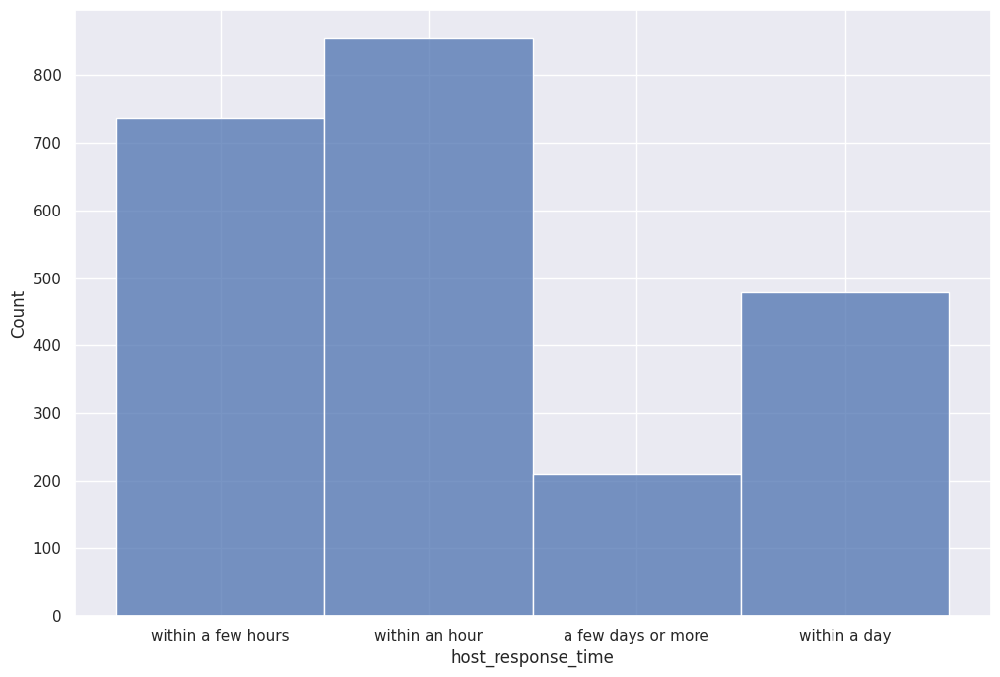

In [43]:
#Plot it against a histplot to see the results
f = plt.figure(figsize=(12,8))
sb.histplot(data = hostResponseDF, x = 'host_response_time')

In [44]:
#Calculate percentages of host for each bin
hostResponseDF.value_counts()

host_response_time
within an hour        854
within a few hours    737
within a day          479
a few days or more    210
dtype: int64

In [45]:
length = len(hostResponseDF)
#Print the percentages
print("Within an hour: ", round((855/length) * 100,2), "%", sep = "")
print("Within a few hours: ", round((738/length) * 100,2), "%", sep = "")
print("Within a day: ", round((480/length) * 100,2), "%", sep = "")
print("A few days or more: ", round((114/length) * 100,2), "%", sep = "")

Within an hour: 37.5%
Within a few hours: 32.37%
Within a day: 21.05%
A few days or more: 5.0%


#### INSIGHT: We can observe that majority of the hosts has a response time of within an hour, with 855 hosts replying within an hour. Generally, about 21.95% of hosts reply within a day.

---
### 2. neighbourhood_cleansed
<b>neighbourhood_group_cleansed</b>: The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.

In [46]:
neighbourhoodDF = pd.DataFrame(airDF["neighbourhood_cleansed"])
neighbourhoodDF

,neighbourhood_cleansed
0,Tampines
1,Tampines
2,Bukit Merah
3,Bukit Merah
4,Tampines
...,...
2275,Singapore River
2276,Singapore River
2277,Singapore River
2278,Downtown Core


In [47]:
neighbourhoodDF.describe()

,neighbourhood_cleansed
count,2280
unique,38
top,Downtown Core
freq,288


<Axes: xlabel='neighbourhood_cleansed', ylabel='Count'>

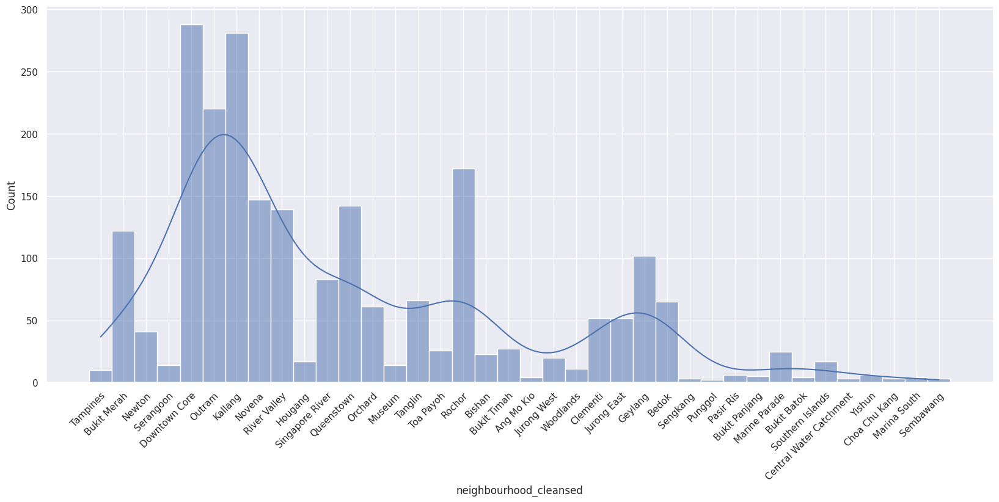

In [48]:
#Plot it against a histplot to see the results
f = plt.figure(figsize = (20,8))
plt.xticks(np.arange(0, len(neighbourhoodDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
sb.histplot(data = neighbourhoodDF["neighbourhood_cleansed"], kde = True)

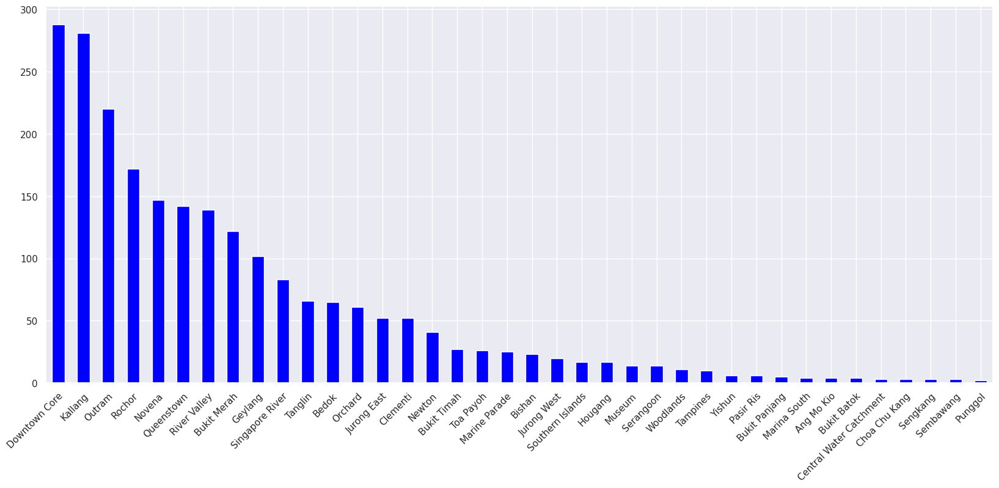

In [49]:
#Plot it against a different plot in ascending order to see the results
f = plt.figure(figsize = (20,8))

neighbourhoodDF["neighbourhood_cleansed"].value_counts().plot(kind='bar',color=['blue'])
plt.xticks(np.arange(0, len(neighbourhoodDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
plt.show()
#sb.histplot(data = neighbourhoodDF["neighbourhood_cleansed"])

#### We can see that **Downtown Core** has the highest amount of listings, let us plot a map to see it with colors for better visualization

In [50]:
#Calculate the percentages and store it into a series
percentages = {}
numbers = {}
#Store keys
for x in mapDF["name"]:
    percentages[x] = 0
    numbers[x] = 0
#Then update all the values
for x in neighbourhoodDF["neighbourhood_cleansed"]:
    percentages[x.upper()] += 1
    numbers[x.upper()] += 1
    
#Calculate percentages
for key, item in percentages.items():
    percentages[key] = round((item/len(neighbourhoodDF["neighbourhood_cleansed"])*100),3)

In [51]:
#Add our percentages into geo json
percentageMapDF = mapDF.copy()
#Set up new column
percentageMapDF["listingnumber"] = 0
percentageMapDF["percentage"] = 0

count = 0
#Add in according to name
for keys, value in percentages.items():
   percentageMapDF.loc[:,('percentage')][count] = value
   count += 1

count = 0
#Add in according to name
for keys, value in numbers.items():
   percentageMapDF.loc[:,('listingnumber')][count] = value
   count += 1

percentageMapDF.head(5)

<ipython-input-51-22ba4c4e811b>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  percentageMapDF.loc[:,('percentage')][count] = value
<ipython-input-51-22ba4c4e811b>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  percentageMapDF.loc[:,('listingnumber')][count] = value


,name,geometry,latitude,longitude,listingnumber,percentage
0,BISHAN,"POLYGON ((103.84924 1.36275, 103.84936 1.36268...",1.352585,103.835212,23,1.009
1,BUKIT BATOK,"POLYGON ((103.76408 1.37001, 103.76444 1.36947...",1.359029,103.763680,4,0.175
2,BUKIT MERAH,"POLYGON ((103.81740 1.29433, 103.81743 1.29431...",1.281905,103.823918,122,5.351
3,BUKIT PANJANG,"POLYGON ((103.77445 1.39029, 103.77499 1.38607...",1.377414,103.771950,5,0.219
4,BUKIT TIMAH,"POLYGON ((103.79766 1.34813, 103.79806 1.34779...",1.329411,103.802078,27,1.184


### Let us visualize the distribution on the map

In [52]:
#Create the map
map = folium.Map(
    #Center the map here at location
    location = [lat_mean, long_mean], zoom_start = 12.5
)
#Make choropleth map
choro_test = folium.Choropleth(geo_data = geojson,
            data = percentageMapDF,
            columns = ['name','listingnumber'],
            key_on = 'feature.properties.name',
            fill_color = 'BuPu', # colour of choropleth
            nan_fill_color = "White", # color for empty data
            fill_opacity = 0.6, #density of colour
            line_opacity = 0.5,
            line_color = 'black',
            legend_name= "Listings",
            nan_fill_opacity = 0.1).add_to(map)

#Then add some clickable markers
# add marker one by one on the map
for i in range(0,len(percentageMapDF)):
   folium.Marker(
      location=[percentageMapDF.iloc[i]['latitude'], percentageMapDF.iloc[i]['longitude']],
      popup= percentageMapDF.iloc[i]['name'] + "\n Listings:" + str(percentageMapDF.iloc[i]['listingnumber']),
   ).add_to(map)

map

#### It is true that Kallang, Downtown Core and Outram has the highest proportion of houses as compared to the others areas as highlighted heavily in purple.
> **The markers in the map can be clicked to show the amount of listings in the area!**

---
### 3. neighbourhood_group_cleansed
<b>neighbourhood_group_cleansed</b>: The neighbourhood group as geocoded using the latitude and longitude against neighborhoods as defined by open or public digital shapefiles.

In [53]:
neighbourhoodGroupDF = pd.DataFrame(airDF["neighbourhood_group_cleansed"])
neighbourhoodGroupDF

,neighbourhood_group_cleansed
0,East Region
1,East Region
2,Central Region
3,Central Region
4,East Region
...,...
2275,Central Region
2276,Central Region
2277,Central Region
2278,Central Region


In [54]:
neighbourhoodGroupDF.describe()

,neighbourhood_group_cleansed
count,2280
unique,5
top,Central Region
freq,2000


<Axes: xlabel='neighbourhood_group_cleansed', ylabel='Count'>

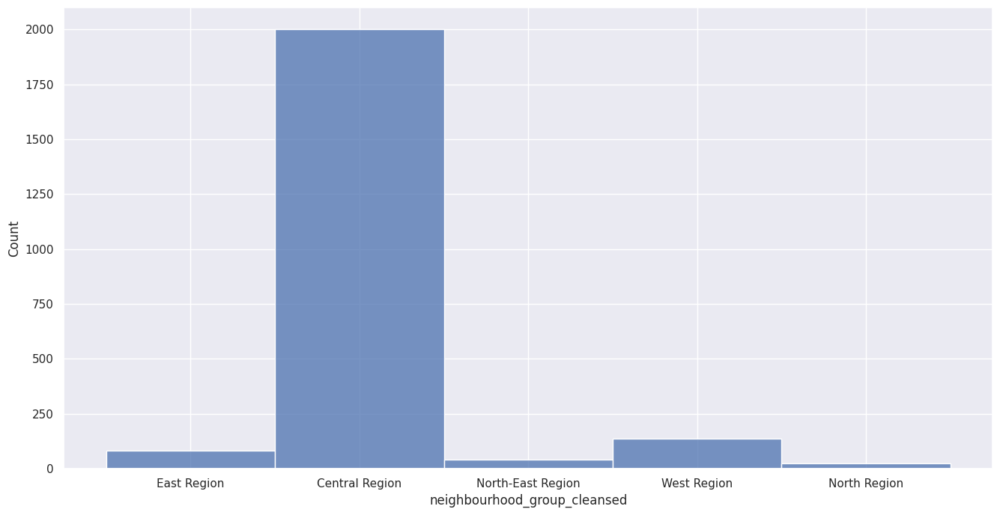

In [55]:
#Plot out a histogram to see the plots
f = plt.figure(figsize = (16,8))
sb.histplot(data = neighbourhoodGroupDF["neighbourhood_group_cleansed"])

#### We can see that there are many property listings in the central region as compared to the other regions like north east region or west region. This is probably due to the central region being closer as tourists attractions, so there is a higher amount of listings there. This can be seen in the map above as well.

---
### 4. property_type
**property_type** : Self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field

In [56]:
propertyTypeDF = pd.DataFrame(airDF["property_type"])
propertyTypeDF

,property_type
0,Private room in home
1,Private room in home
2,Private room in rental unit
3,Private room in rental unit
4,Private room in home
...,...
2275,Shared room in hostel
2276,Shared room in guesthouse
2277,Private room in hostel
2278,Room in hotel


In [57]:
propertyTypeDF.describe()

,property_type
count,2280
unique,40
top,Private room in rental unit
freq,401


<Axes: xlabel='property_type', ylabel='Count'>

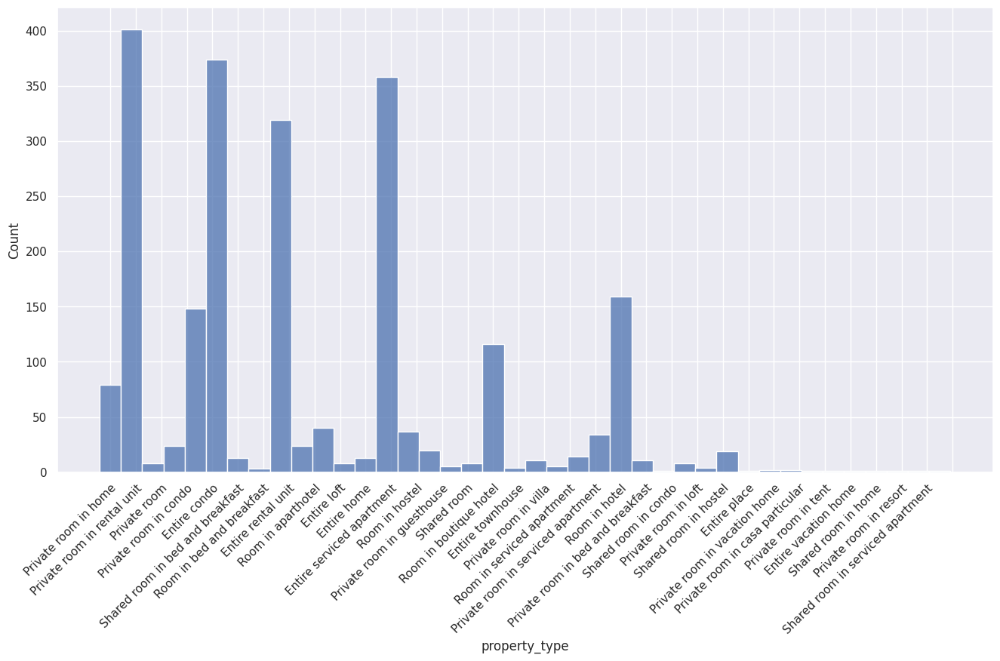

In [58]:
#Let us plot it to try to see and see if we can find any similarities
f = plt.figure(figsize = (16,8))
plt.xticks(np.arange(0, len(propertyTypeDF["property_type"].unique()), step=1.2))  # Set label locations.
plt.xticks(rotation = 45, ha = "right", rotation_mode = "anchor")
sb.histplot(data = propertyTypeDF["property_type"])

#### For property type, there are mainly three types, Private, Entire, Shared. The rest are either rooms in hostels or other niche categories. Let us group according to their categories to classify as one as we cannot work with so many different categories.

In [59]:
#Classify according to their first word up to the space
cleanedDF = pd.DataFrame(propertyTypeDF["property_type"])
count = 0
for x in cleanedDF["property_type"]:
    #Split this
    cleanedDF["property_type"].iloc[count] = cleanedDF["property_type"].iloc[count].split(" ", 1)[0]
    count += 1

cleanedDF

,property_type
0,Private
1,Private
2,Private
3,Private
4,Private
...,...
2275,Shared
2276,Shared
2277,Private
2278,Room


In [60]:
cleanedDF.value_counts()

property_type
Entire           1083
Private           776
Room              369
Shared             52
dtype: int64

<Axes: xlabel='property_type', ylabel='Count'>

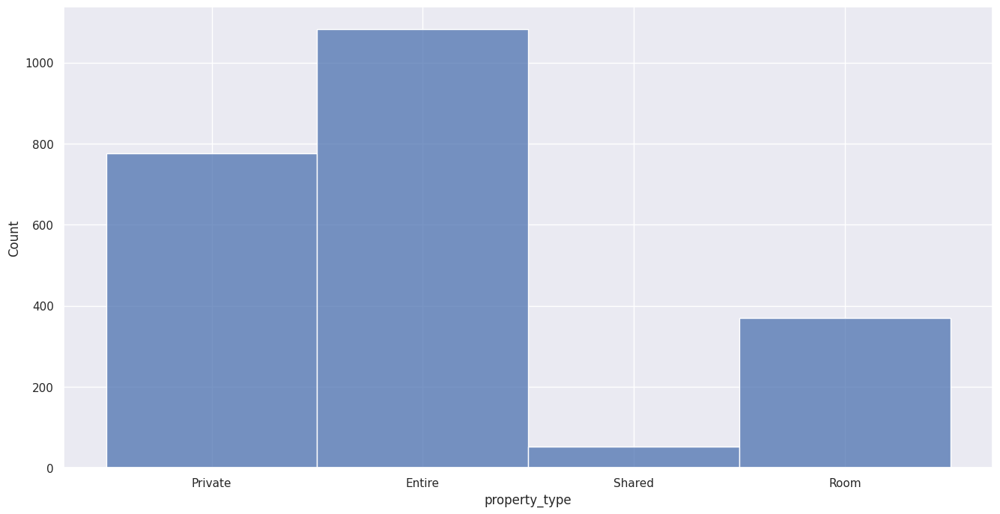

In [61]:
#Plot our updated df
f = plt.figure(figsize = (16,8))
sb.histplot(data = cleanedDF["property_type"])

#### This representation is easier to be classified as we just need the type of room, reducing it to 4 categories. We will see if the type has any effect on the listings price.

---
### 5. accommodates
**accommodates** : The maximum capacity of the listing

In [62]:
accomodateDF = pd.DataFrame(airDF["accommodates"])
accomodateDF

,accommodates
0,1.0
1,2.0
2,1.0
3,1.0
4,4.0
...,...
2275,1.0
2276,1.0
2277,4.0
2278,3.0


In [63]:
accomodateDF.describe()

,accommodates
count,2280.000000
mean,2.682018
std,1.806388
min,0.000000
25%,1.000000
50%,2.000000
75%,4.000000
max,16.000000


<Axes: >

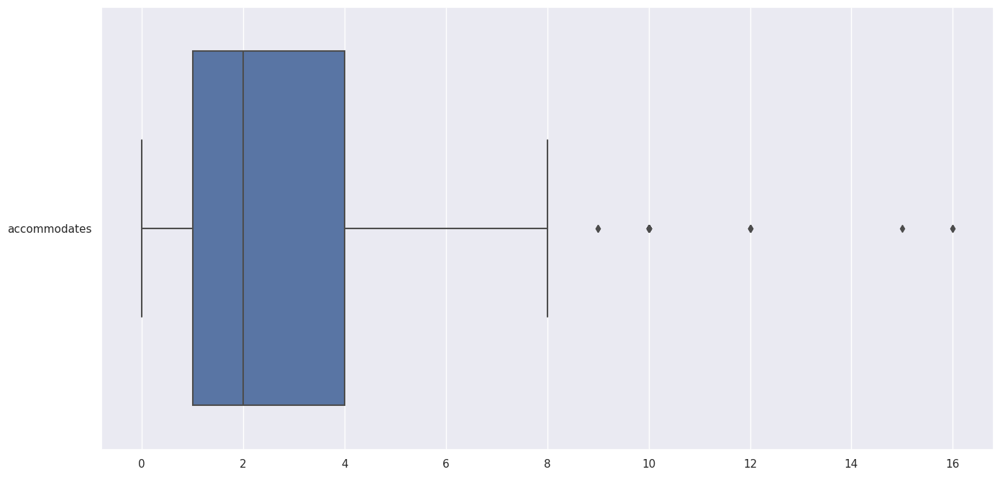

In [64]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = accomodateDF, orient= 'h')

<Axes: ylabel='Count'>

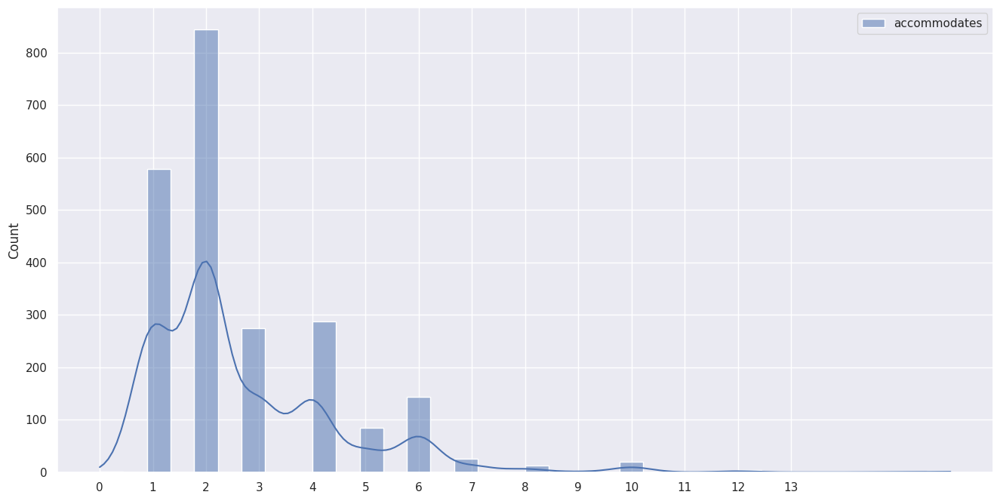

In [65]:
#Plot a histplot first
f = plt.figure(figsize=(16,8))
plt.xticks(np.arange(0, len(accomodateDF["accommodates"].unique()), step=1))  # Set label locations.
sb.histplot(data = accomodateDF, kde = True)

Let us try to remove outliers

In [66]:
accomodateDF = remove_outliers(accomodateDF, ["accommodates"])
accomodateDF

,accommodates
0,1.0
1,2.0
2,1.0
3,1.0
4,4.0
...,...
2275,1.0
2276,1.0
2277,4.0
2278,3.0


<Axes: >

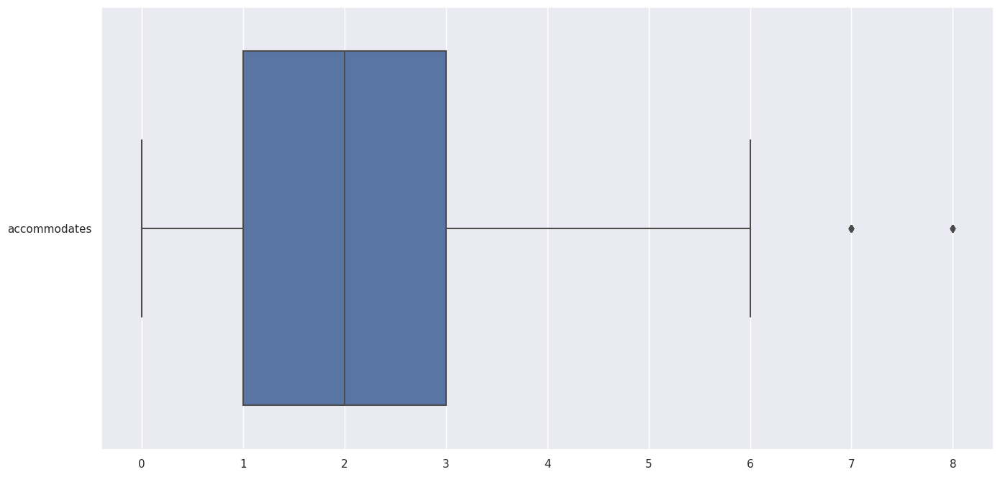

In [67]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = accomodateDF, orient= 'h')

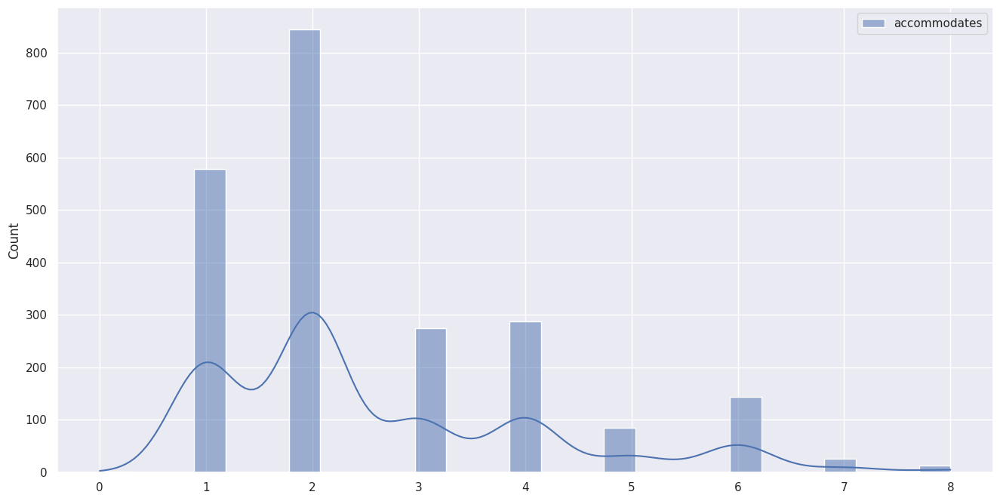

In [68]:
#Plot a histplot first
f = plt.figure(figsize=(16,8))
plt.xticks(np.arange(0, len(accomodateDF["accommodates"].unique()), step=1))  # Set label locations.
sb.histplot(data = accomodateDF, kde = True)
None

#### Generally, most listings have around 1-4 accomodates that can stay at a listing at a time.

---
### 6. amenities
**amenities** : The amenities in this hotel room

In [69]:
amenitiesDF = pd.DataFrame(airDF["amenities"])
amenitiesDF

,amenities
0,"[Cooking basics, Refrigerator, Kitchen, Hair d..."
1,"[Cooking basics, Heating, Kitchen, Hair dryer,..."
2,"[Air conditioning, Shampoo, Smoke alarm, Long ..."
3,"[Air conditioning, Shampoo, Smoke alarm, Long ..."
4,"[Cooking basics, Kitchen, Private entrance, Ha..."
...,...
2275,"[Air conditioning, Fire extinguisher, Security..."
2276,"[Air conditioning, Fire extinguisher, Security..."
2277,"[Air conditioning, Fire extinguisher, Security..."
2278,"[First aid kit, Heating, Refrigerator, Hair dr..."


In [70]:
amenitiesDF.describe()

,amenities
count,2280
unique,1718
top,"[Cooking basics, Heating, Refrigerator, Kitche..."
freq,46


In [71]:
no_amenitiesDF = pd.DataFrame(airDF["no_amenities"])
no_amenitiesDF

,no_amenities
0,28
1,24
2,17
3,18
4,31
...,...
2275,8
2276,8
2277,8
2278,39


In [72]:
no_amenitiesDF.describe()

,no_amenities
count,2280.000000
mean,24.685965
std,10.186440
min,2.000000
25%,17.000000
50%,25.000000
75%,31.000000
max,63.000000


##### Perform analysis on the words appearing in amenities to see what is popular

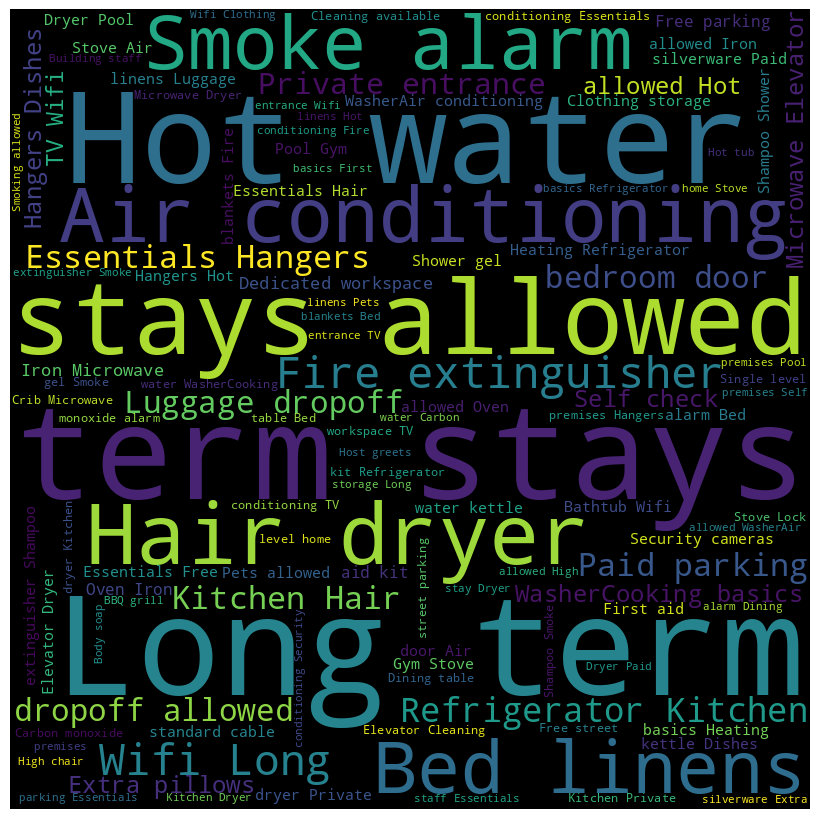

In [73]:
#Gather the neighbourhood overview DF
amenitiesText = "".join(amenitiesDF["amenities"].astype(str))

breaks = ["[","]",'"', "'",'\u2019s']
breaks2 = ['\u2013']

for x in breaks:    
    amenitiesText = amenitiesText.replace(x, "")
    
for x in breaks2:    
    amenitiesText = amenitiesText.replace(x, ",")

#Manually replace commas for space
amenitiesText = amenitiesText.replace(",", " ")

#Create wordcloud
wordcloud = WordCloud(width=800, height=800,
                      background_color='black',
                      min_font_size=10).generate(amenitiesText)

#Plot the wordcloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

#### Many properties have amenities that allow long term stays, air conditioning, and hot water, hair dryers, smoke alarm. This means that most properties that are on listing have these basic amenities.

##### Perform analysis on the number of amenities

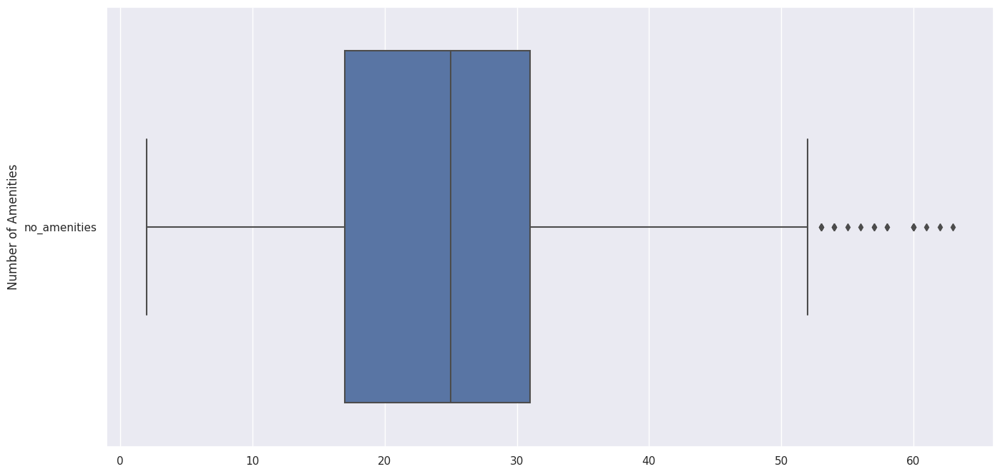

In [74]:
#Plot a boxplot first
f = plt.figure(figsize=(16,8))
sb.boxplot(data = no_amenitiesDF, orient= 'h').set(ylabel = "Number of Amenities")
None

<Axes: xlabel='no_amenities', ylabel='Count'>

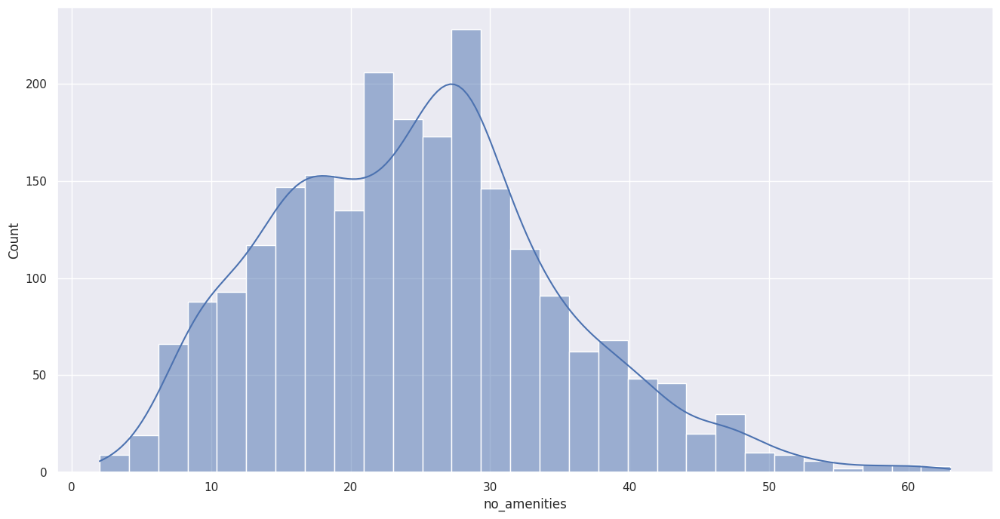

In [75]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = airDF["no_amenities"], kde = True)

#### The number of amenities has potential as being one of the predictors, with it being following a decent distribution, we will compare it to price later in our bivariate exploration.

---
### 7. number_of_reviews
**number_of_reviews** : total number of reviews for each Airbnb listing 

In [76]:
numberOfReviewsDF = pd.DataFrame(airDF["number_of_reviews"])
numberOfReviewsDF

,number_of_reviews
0,24.0
1,47.0
2,22.0
3,14.0
4,12.0
...,...
2275,0.0
2276,0.0
2277,0.0
2278,0.0


In [77]:
numberOfReviewsDF.describe()

,number_of_reviews
count,2280.000000
mean,9.852632
std,28.571277
min,0.000000
25%,0.000000
50%,1.000000
75%,5.000000
max,361.000000


<Axes: >

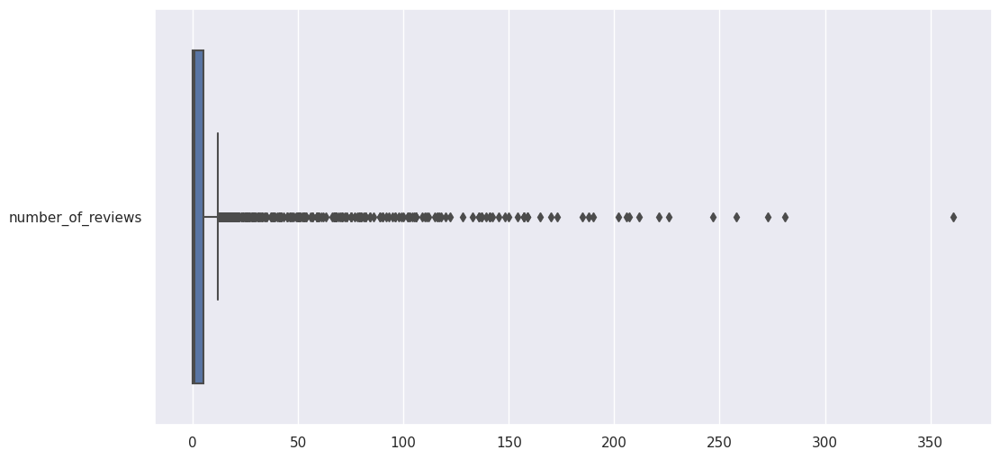

In [78]:
f = plt.figure(figsize=(12,6))
sb.boxplot(data = numberOfReviewsDF , orient = 'h')

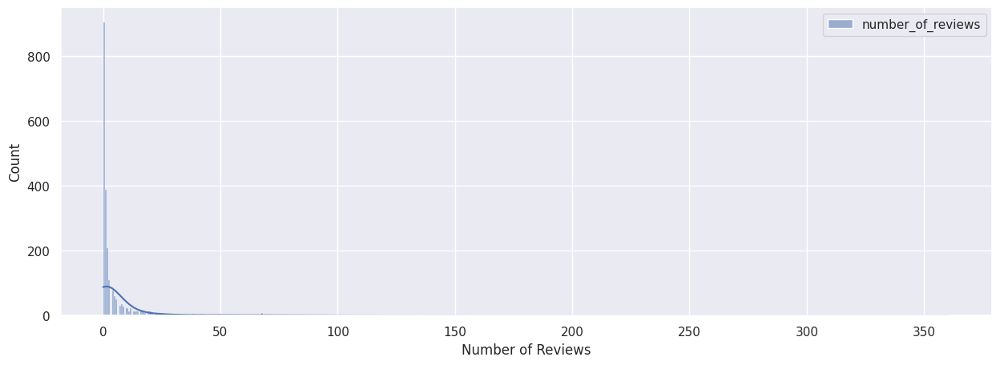

In [79]:
f= plt.figure(figsize = (15, 5))
sb.histplot(data = numberOfReviewsDF, kde= True).set(xlabel = "Number of Reviews",)
None

In [80]:
print("Skew:",numberOfReviewsDF.skew())

Skew: number_of_reviews    5.238199
dtype: float64


### There are quite a few outliers, let us take a look without the outliers to find the trend

In [81]:
numberOfReviewsDF = remove_outliers(numberOfReviewsDF, ["number_of_reviews"])
numberOfReviewsDF

,number_of_reviews
4,12.0
7,12.0
8,4.0
12,0.0
15,2.0
...,...
2275,0.0
2276,0.0
2277,0.0
2278,0.0


<Axes: >

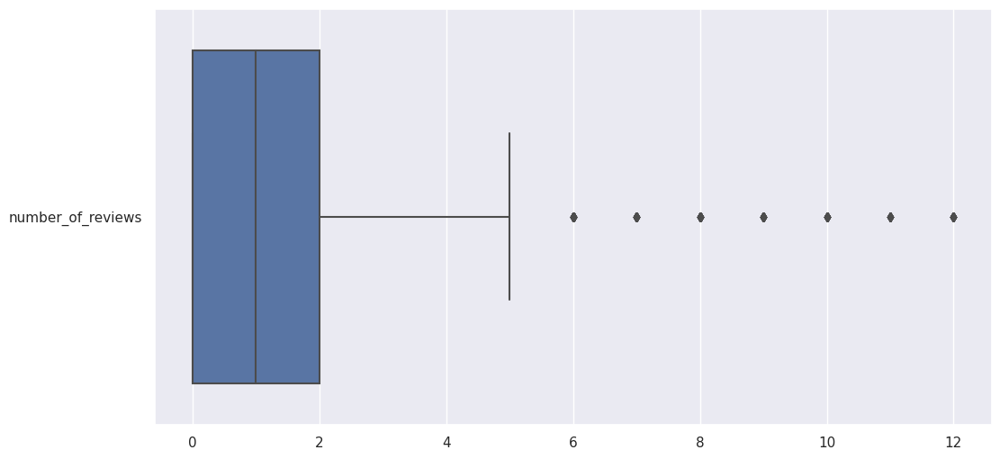

In [82]:
f = plt.figure(figsize=(12,6))
sb.boxplot(data = numberOfReviewsDF , orient = 'h')

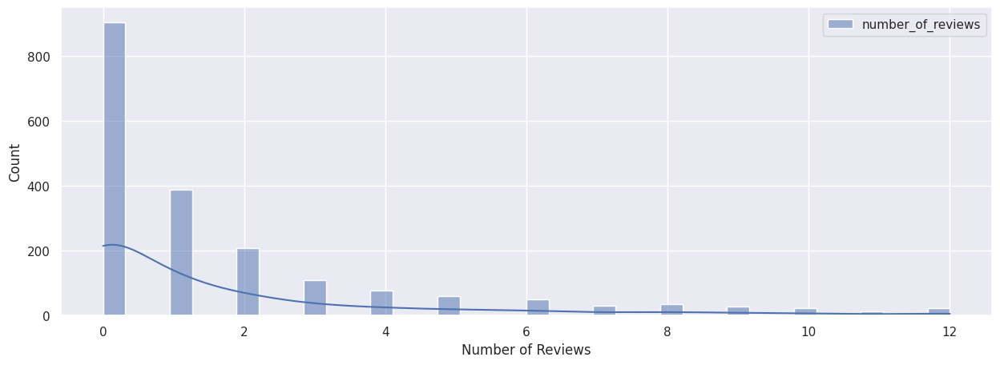

In [83]:
f= plt.figure(figsize = (15, 5))
#plt.xticks(np.arange(0, len(numberOfReviewsDF["number_of_reviews"].unique()), step=1))  # Set label locations.
sb.histplot(data = numberOfReviewsDF, kde = True).set(xlabel = "Number of Reviews")
None

In [84]:
print("Skew:",numberOfReviewsDF.skew())

Skew: number_of_reviews    1.98259
dtype: float64


Insight: We can see that majority of listings had 0 reviews, so we can use this to check if the number of reviews affects the price of a listing in our bivariate exploration.

---
## Other variables for further analysis that we will not use for prediction, but use for insights


### Extra 1. description
**description** : The description of the Airbnb listing.

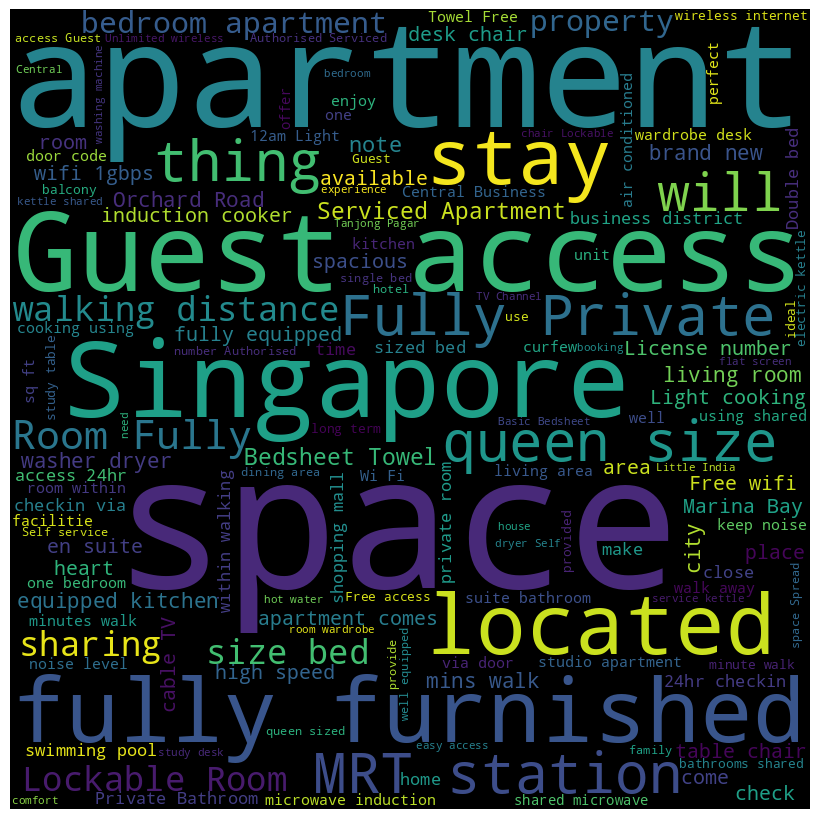

In [85]:
#Gather the description DF
descriptionDF = airDF["description"].copy();
#Make it into a text
descriptionText = " ".join(descriptionDF.astype(str))
#Declare some variables we do not want
breaks = ["<b>","</b>","<b/>","<br />","<br>"]
#Replace each letter in the text with this
for x in breaks:    
    descriptionText = descriptionText.replace(x, " ")

#Create our wordcloud 
wordcloud = WordCloud(width=800, height=800,
                      background_color='black',
                      min_font_size=10).generate(descriptionText)

#Plot wordcloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()


##### INSIGHTS : The Singapore Airbnb listings dataset description column's prominent use of words such as "fully furnished", "guest access", "space", "located", "MRT station", and "walking distance" reveals that there are high amount of listings that mention about walking distances near to MRT stations, and also the interior of the house.

---
### Extra 2. neighbourhood_overview
**neighbourhood_overview** : A brief overview of the neighborhood where the Airbnb listing is located.

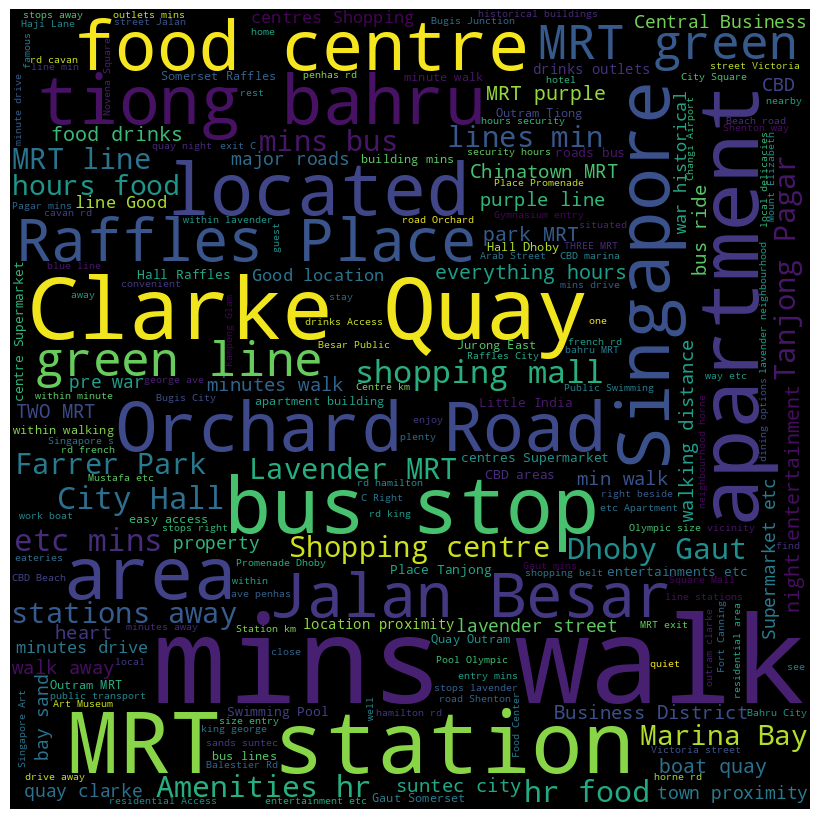

In [86]:
#Gather the neighbourhood overview DF
neighborhoodDF = airDF["neighborhood_overview"].copy()
neighborhoodText = " ".join(neighborhoodDF.astype(str))

breaks = ["<b>","</b>","<b/>","<br />","<br>", "nan"]

for x in breaks:    
    neighborhoodText = neighborhoodText.replace(x, " ")

#Create wordcloud
wordcloud = WordCloud(width=800, height=800,
                      background_color='black',
                      min_font_size=10).generate(neighborhoodText)

#Plot the wordcloud
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

##### INSIGHTS : The Singapore Airbnb listings dataset neighbourhood_overview column's prominent use of words such as "MRT station", "mins walk" , "bus stop", "Raffles Place", "Orchard Road", "Green Line" , "Clarke Quay" and "food centre", it can be inferred that a higher proportion of listings are near the central region of Singapore, and are also within walking distance to the MRT station specifically East-West-Line (green line)

---
### Extra 3. latitude and longitude
**latitude** : the latitude of this property
**longitude** : the longitude of this property

In [87]:
latlongDF = pd.DataFrame(airDF[["latitude","longitude"]])
latlongDF

,latitude,longitude
0,1.347540,103.959580
1,1.345310,103.961000
2,1.290150,103.808140
3,1.288360,103.811440
4,1.344900,103.959790
...,...,...
2275,1.287416,103.847270
2276,1.287416,103.847270
2277,1.287416,103.847270
2278,1.281098,103.859833


In [88]:
latlongDF.describe()

,latitude,longitude
count,2280.000000,2280.000000
mean,1.303926,103.842080
std,0.024321,0.036043
min,1.248260,103.689840
25%,1.284505,103.835527
50%,1.301410,103.846340
75%,1.314700,103.858235
max,1.450538,103.977662


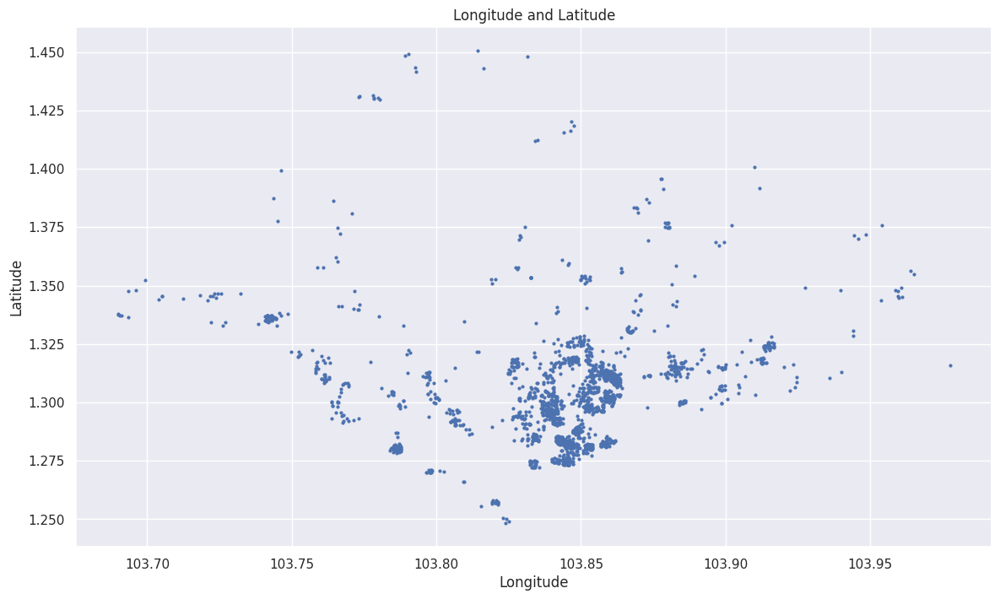

In [89]:
#Plot out the lat long of our in a plot to see the distribution of points
f = plt.figure(figsize = (14,8))
ax = f.add_subplot(1, 1, 1)

# Plot the data
ax.plot(latlongDF["longitude"], latlongDF["latitude"] ,marker='o', markersize=2, linestyle='')

# Set the title and axis labels
ax.set_title('Longitude and Latitude')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

### Lets visualize this onto our map to see our properties

In [90]:
#Create the map
map = folium.Map(
    #Center the map here at location
    location = [lat_mean, long_mean], zoom_start = 12.5
)
#Make choropleth map
choro_test = folium.Choropleth(geo_data = geojson,
            data = percentageMapDF,
            columns = ['name','listingnumber'],
            key_on = 'feature.properties.name',
            fill_color = 'BuPu', # colour of choropleth
            nan_fill_color = "White", # color for empty data
            fill_opacity = 0.6, #density of colour
            line_opacity = 0.5,
            line_color = 'black',
            legend_name= "Listings",
            nan_fill_opacity = 0.1).add_to(map)

#Add our lat long points
#Plot all points
for point in range(0, len(area_lat_long)):
  _ = folium.Circle(
      radius = 10,
      location =  area_lat_long[point],
      popup = "{0}, {1},{2} \n{3}\n{4}".format(airDF["name"][point], area_lat_long[point][0], area_lat_long[point][1], airDF["listing_url"][point], airDF["neighbourhood_cleansed"][point]),
      color = "crimson",
      fill = True,
      fill_opacity = 0.5).add_to(map)

map

#### We can see a large number of points being concentrated in the central region, as well as Kallang, Downtown Core and Outram as shown in the EDA above, which can be good to cluster. 

**>>>>>>>>>>individual points can be clicked to view its info!<<<<<<<<<<<<<**

---

# 2. Bivariate EDA

## Price as Response:  
We will be using price as a response for simplicity.

In [91]:
priceDF = pd.DataFrame(airDF['price'])
priceDF

,price
0,81
1,81
2,52
3,49
4,175
...,...
2275,45
2276,45
2277,186
2278,797


--- 
## <b>1. host_response_time vs price</b>

In [92]:
hostResponseAndPrice = pd.DataFrame(airDF[['host_response_time','price']])
hostResponseAndPrice

,host_response_time,price
0,within a few hours,81
1,within a few hours,81
2,within an hour,52
3,within an hour,49
4,within a few hours,175
...,...,...
2275,within an hour,45
2276,within an hour,45
2277,within an hour,186
2278,within an hour,797


In [93]:
hostResponseAndPrice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2280 entries, 0 to 2279
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   host_response_time  2280 non-null   object
 1   price               2280 non-null   int32 
dtypes: int32(1), object(1)
memory usage: 26.8+ KB


In [94]:
hostResponseAndPrice.describe()

,price
count,2280.000000
mean,266.197807
std,323.771558
min,0.000000
25%,81.000000
50%,179.000000
75%,328.000000
max,4763.000000


In [95]:
#we remove those outliers to have a better picture of host Response vs Price 
hostResponseAndPrice = remove_outliers(hostResponseAndPrice,['price'])

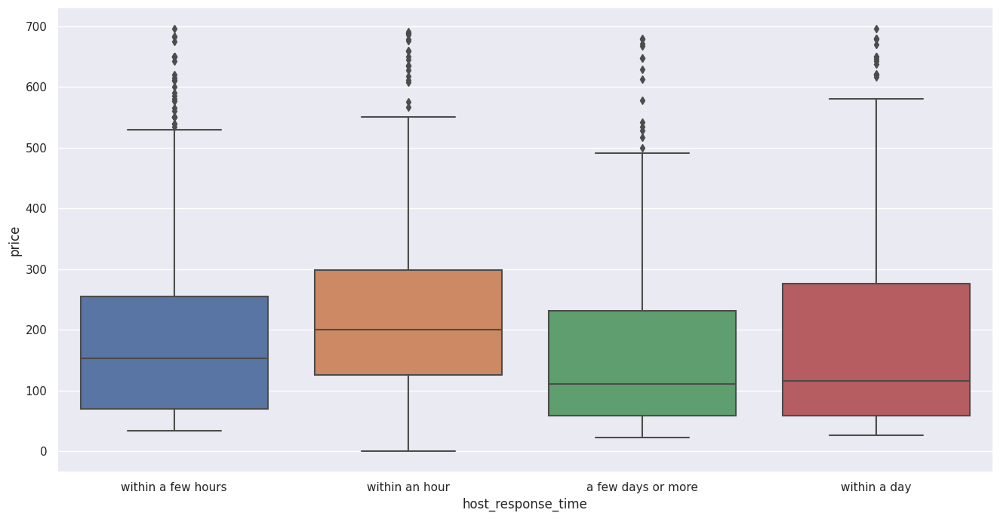

In [96]:
f = plt.figure(figsize = (16,8))
sb.boxplot(data = hostResponseAndPrice , x = 'host_response_time' , y = 'price')
None

 There appears to be a positive correlation between response time and the price of the listing , suggesting that hosts who can reply within an hour tend to command higher prices compared to those who take a few days or more to respond.

---
##  **2. neighbourhood_cleansed vs price**

In [97]:
neighbourhoodDF = pd.DataFrame(airDF["neighbourhood_cleansed"])
neighbourhoodDF

,neighbourhood_cleansed
0,Tampines
1,Tampines
2,Bukit Merah
3,Bukit Merah
4,Tampines
...,...
2275,Singapore River
2276,Singapore River
2277,Singapore River
2278,Downtown Core


In [98]:
neighbourhoodDF.describe()

,neighbourhood_cleansed
count,2280
unique,38
top,Downtown Core
freq,288


So far, not surprising, we see that Downtown Core is still the top with a frequncy of 288 as seen in our EDA in the other files. Let us plot it against price to observe any trends

In [99]:
neighbourHoodPriceDF = pd.concat([neighbourhoodDF , priceDF] , axis = 1)
neighbourHoodPriceDF.head(n=5)

,neighbourhood_cleansed,price
0,Tampines,81
1,Tampines,81
2,Bukit Merah,52
3,Bukit Merah,49
4,Tampines,175


In [100]:
neighbourHoodPriceDF.describe()

,price
count,2280.000000
mean,266.197807
std,323.771558
min,0.000000
25%,81.000000
50%,179.000000
75%,328.000000
max,4763.000000


<Axes: xlabel='neighbourhood_cleansed', ylabel='price'>

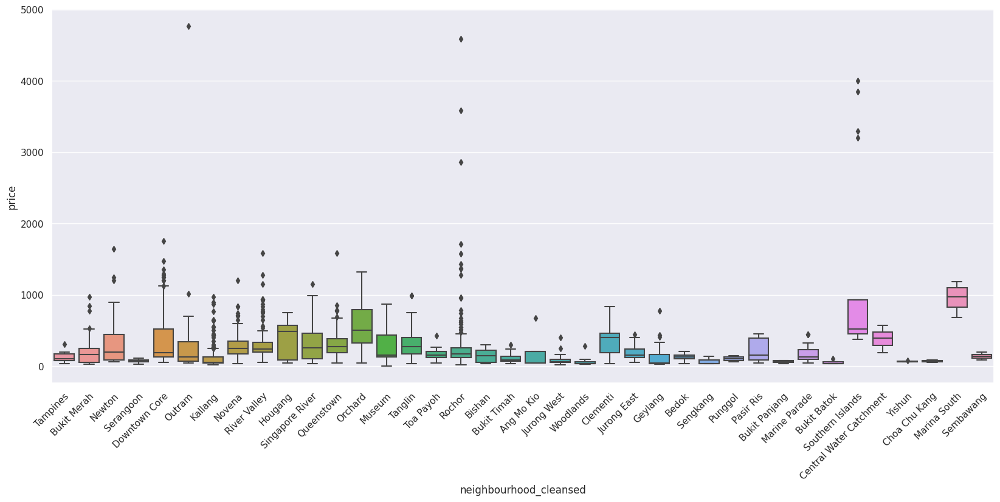

In [101]:
f = plt.figure(figsize = (20,8))
plt.xticks(np.arange(0, len(neighbourHoodPriceDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
sb.boxplot(data = neighbourHoodPriceDF , x = 'neighbourhood_cleansed' , y = 'price')

Let us remove outliers so we can visualize the results abit more clearly...

In [102]:
neighbourHoodPriceDF = remove_outliers(neighbourHoodPriceDF, ["price"])
neighbourHoodPriceDF

,neighbourhood_cleansed,price
0,Tampines,81
1,Tampines,81
2,Bukit Merah,52
3,Bukit Merah,49
4,Tampines,175
...,...,...
2274,Singapore River,45
2275,Singapore River,45
2276,Singapore River,45
2277,Singapore River,186


<Axes: xlabel='neighbourhood_cleansed', ylabel='price'>

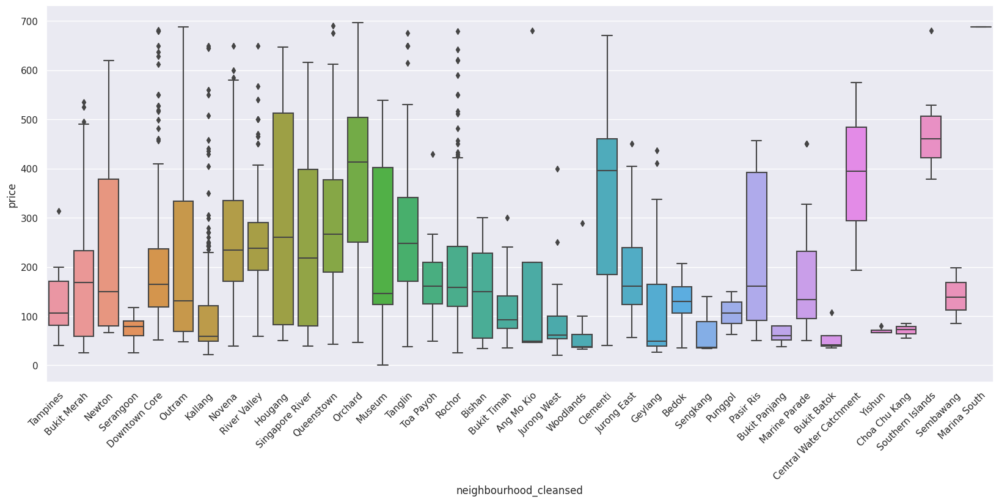

In [103]:
f = plt.figure(figsize = (20,8))
plt.xticks(np.arange(0, len(neighbourHoodPriceDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
sb.boxplot(data = neighbourHoodPriceDF , x = 'neighbourhood_cleansed' , y = 'price')

### Generally, we can see the airbnb listings at Southern Islands (Sentosa) and Orchard area have the highest median in price listings, which makes sense as they are tourist attractions in Singapore. In comparison places like Ang Mo Kio and Yishun have lower airbnb price listings. But it seems we can't gather much, so let us conduct EDA on the neighbourhood groups (region in which a listing is) to see if more inferences can be made in general.

---
##  **3. neighbour_group_cleansed vs price**

In [104]:
neighbourHoodGroupDF = pd.DataFrame(airDF["neighbourhood_group_cleansed"])
neighbourHoodGroupDF.head(n=5)

,neighbourhood_group_cleansed
0,East Region
1,East Region
2,Central Region
3,Central Region
4,East Region


In [105]:
neighbourHoodGroupDF.describe()

,neighbourhood_group_cleansed
count,2280
unique,5
top,Central Region
freq,2000


In [106]:
neighbourHoodGroupDF.value_counts()

neighbourhood_group_cleansed
Central Region                  2000
West Region                      136
East Region                       81
North-East Region                 40
North Region                      23
dtype: int64

This aligns with our initial EDA, where we previously saw many points in the central region (Downtown Core, Orchard, Kallang) in our EDA on individual variables.

In [107]:
#we concactenate property_type and price columns
neighbourHoodGroupPriceDF = pd.concat([neighbourHoodGroupDF , priceDF] , axis = 1)
neighbourHoodGroupPriceDF.head(n=5)

,neighbourhood_group_cleansed,price
0,East Region,81
1,East Region,81
2,Central Region,52
3,Central Region,49
4,East Region,175


<Axes: xlabel='neighbourhood_group_cleansed', ylabel='price'>

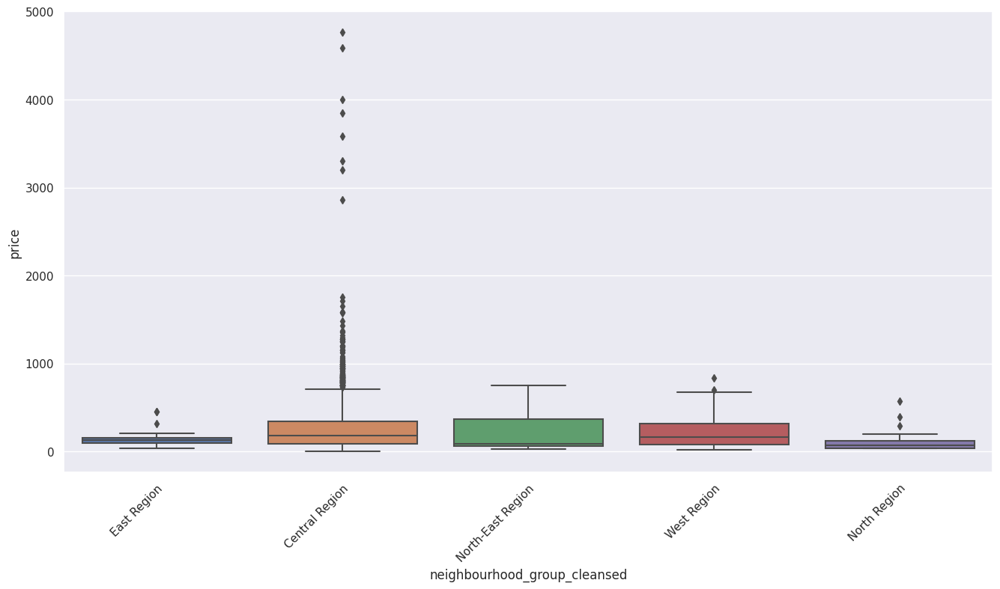

In [108]:
f = plt.figure(figsize = (16,8))
#plt.xticks(np.arange(0, len(neighbourHoodGroupPriceDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
sb.boxplot(data = neighbourHoodGroupPriceDF , x = 'neighbourhood_group_cleansed' , y = 'price')

In [109]:
#Remove outliers and replot
neighbourHoodGroupPriceDF = remove_outliers(neighbourHoodGroupPriceDF, ["price"])
neighbourHoodGroupPriceDF.head(n=5)

,neighbourhood_group_cleansed,price
0,East Region,81
1,East Region,81
2,Central Region,52
3,Central Region,49
4,East Region,175


<Axes: xlabel='neighbourhood_group_cleansed', ylabel='price'>

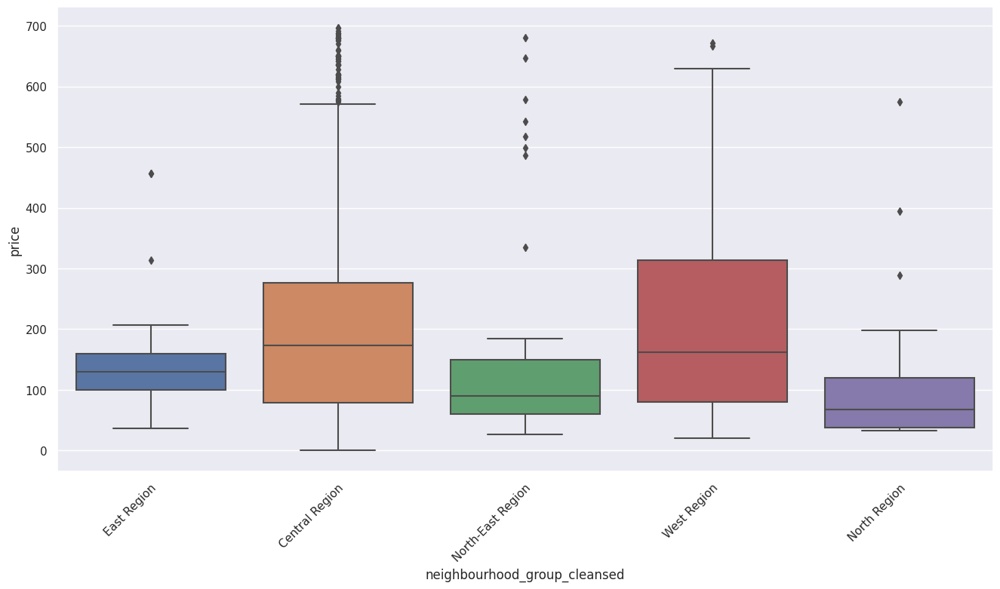

In [110]:
f = plt.figure(figsize = (16,8))
#plt.xticks(np.arange(0, len(neighbourHoodGroupPriceDF["neighbourhood_cleansed"].unique()), step=1))  # Set label locations.
plt.xticks(rotation =45, ha = "right", rotation_mode = "anchor")
sb.boxplot(data = neighbourHoodGroupPriceDF , x = 'neighbourhood_group_cleansed' , y = 'price')

### There are two categories of property listings with a higher median price, Central Region and West Region. However, Central Region property listings have a higher median than West Region, which should be expected. However, Central Region has more outliers than any other categories, which makes sense as Central Region also includes non tourist places, and the outliers are probably the property listings in tourist areas such as Orchard.

---
##  **4. property_type vs price**

In [111]:
propertyTypeDF = pd.DataFrame(airDF['property_type'])
propertyTypeDF

,property_type
0,Private room in home
1,Private room in home
2,Private room in rental unit
3,Private room in rental unit
4,Private room in home
...,...
2275,Shared room in hostel
2276,Shared room in guesthouse
2277,Private room in hostel
2278,Room in hotel


### Since we know that there are mainly three types of properties -> Private, entire, shared. We will group them according to their categories and compare it against price

<Axes: xlabel='property_type', ylabel='Count'>

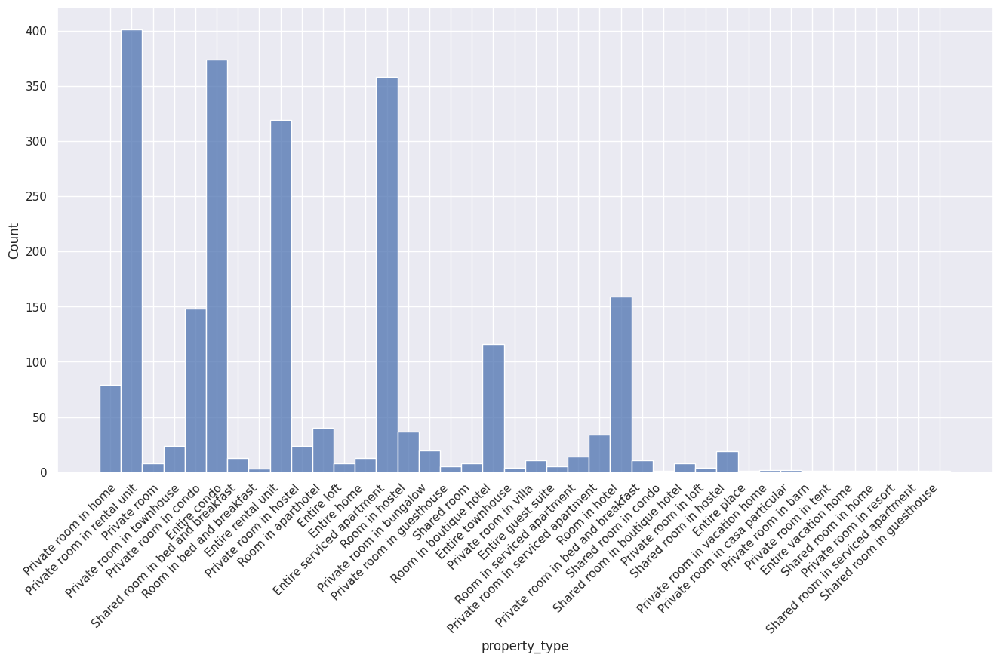

In [112]:
#Let us plot it to try to see and see if we can find any similarities
f = plt.figure(figsize = (16,8))
plt.xticks(rotation = 45, ha = "right", rotation_mode = "anchor")
sb.histplot(data = propertyTypeDF["property_type"])

In [113]:
  #Classify according to their first word up to the space
propertyTypeDF = pd.DataFrame(propertyTypeDF["property_type"])
count = 0
for x in propertyTypeDF["property_type"]:
    #Split this
    s = propertyTypeDF["property_type"].iloc[count].split(" ", 1)[0]
    if s == "Private":
      s = "Private room"
    elif s == "Entire":
      s = "Entire home/apt"
    elif s == "Room":
      s= "Hotel/Hostel"
    elif s == "Shared":
      s= "Shared room"
    propertyTypeDF["property_type"].iloc[count] = s
    count += 1
#we print out the values to check if its cleaned properly
propertyTypeDF

,property_type
0,Private room
1,Private room
2,Private room
3,Private room
4,Private room
...,...
2275,Shared room
2276,Shared room
2277,Private room
2278,Hotel/Hostel


<Axes: xlabel='property_type', ylabel='Count'>

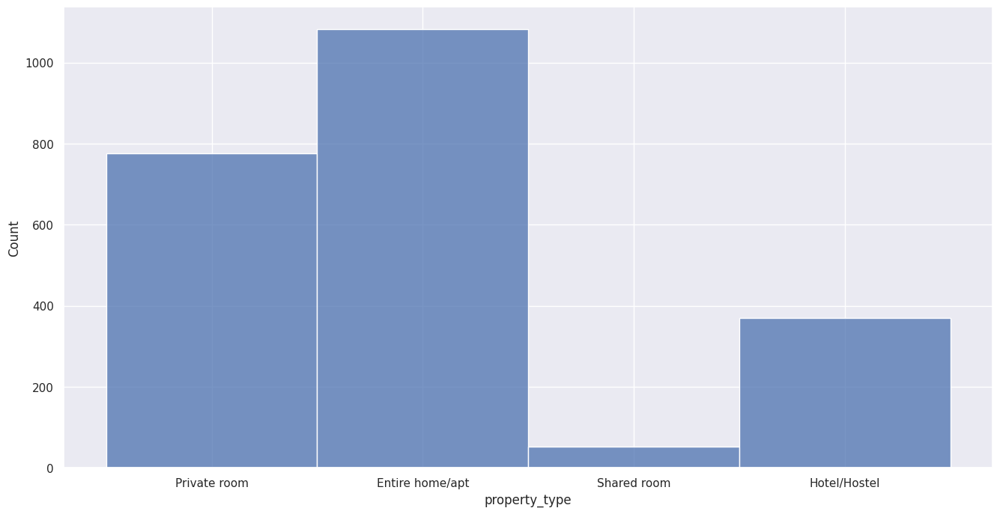

In [114]:
#Plot our updated df
f = plt.figure(figsize = (16,8))
sb.histplot(data = propertyTypeDF["property_type"])

In [115]:
propertyTypeDF.value_counts()

property_type  
Entire home/apt    1083
Private room        776
Hotel/Hostel        369
Shared room          52
dtype: int64

In [116]:
#we concactenate property_type and price columns
propertyTypeVsPrice = pd.concat([propertyTypeDF , priceDF] , axis = 1)
propertyTypeVsPrice

,property_type,price
0,Private room,81
1,Private room,81
2,Private room,52
3,Private room,49
4,Private room,175
...,...,...
2275,Shared room,45
2276,Shared room,45
2277,Private room,186
2278,Hotel/Hostel,797


In [117]:
#we remove those outliers to have a better picture of property_type vs Price 
propertyTypeVsPrice = removeOutliers(propertyTypeVsPrice,'price')
print(propertyTypeVsPrice.isna().sum())

property_type    0
price            0
dtype: int64


In [118]:
propertyTypeVsPrice.describe()

,price
count,2108.000000
mean,200.828273
std,149.494376
min,0.000000
25%,79.000000
50%,165.000000
75%,268.250000
max,696.000000


<Axes: xlabel='property_type', ylabel='price'>

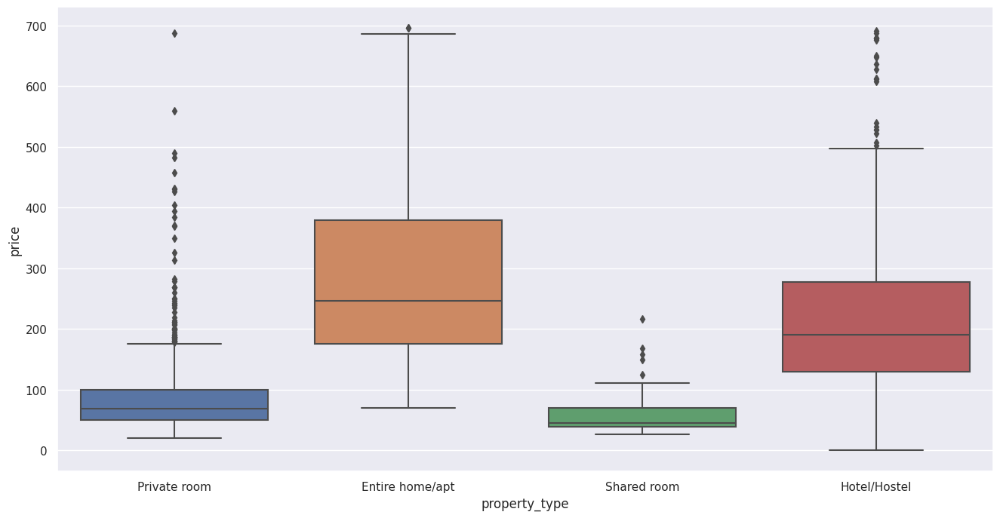

In [119]:
f = plt.figure(figsize = (16,8))
sb.boxplot(data = propertyTypeVsPrice , x = 'property_type' , y = 'price')

### We see that entire home apartment listings are generally more expensive than other listings, with the highest median as compared to the other types of listings. Hotel/Hostels come in second, which is not surprising as hotels generally range around the high 200s range.  

### We can also observe that the amount of outliers for private rooms are very high, and this may be because of how the owner chooses to value his listing.

---
## 5. Accomodates vs price

In [120]:
accomodateDF = pd.DataFrame(airDF["accommodates"])
priceDF = pd.DataFrame(airDF["price"])
priceDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2280 entries, 0 to 2279
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   price   2280 non-null   int32
dtypes: int32(1)
memory usage: 9.0 KB


In [121]:
accomodateDF.describe()

,accommodates
count,2280.000000
mean,2.682018
std,1.806388
min,0.000000
25%,1.000000
50%,2.000000
75%,4.000000
max,16.000000


<Axes: >

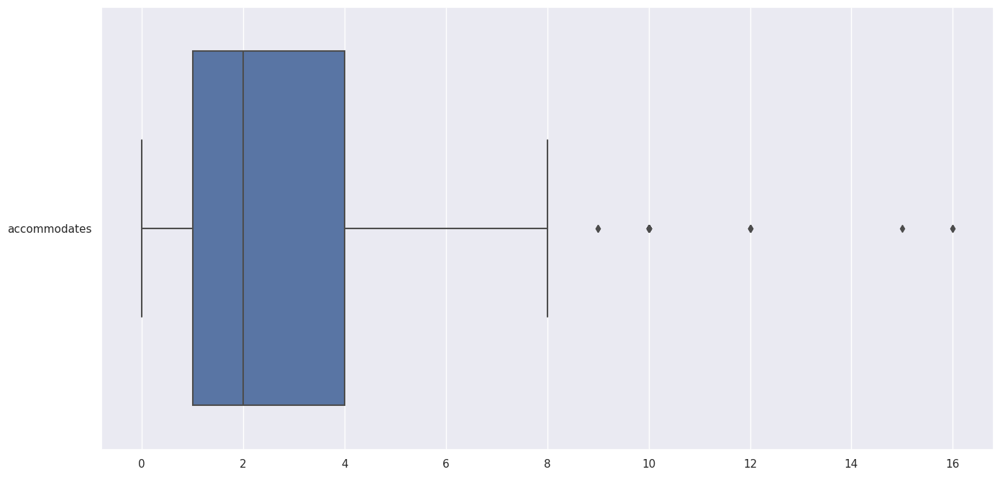

In [122]:
f = plt.figure(figsize=(16,8))
sb.boxplot(data = accomodateDF, orient= 'h')

In [123]:
#concatenate price and accomodate
accomodateVsPrice = pd.concat([accomodateDF,priceDF], axis = 1)
accomodateVsPrice

,accommodates,price
0,1.0,81
1,2.0,81
2,1.0,52
3,1.0,49
4,4.0,175
...,...,...
2275,1.0,45
2276,1.0,45
2277,4.0,186
2278,3.0,797


In [124]:
accomodateVsPrice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2280 entries, 0 to 2279
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   accommodates  2280 non-null   float64
 1   price         2280 non-null   int32  
dtypes: float64(1), int32(1)
memory usage: 26.8 KB


In [125]:
accomodateVsPrice = removeOutliers(accomodateVsPrice,"price")
accomodateVsPrice

,accommodates,price
0,1.0,81
1,2.0,81
2,1.0,52
3,1.0,49
4,4.0,175
...,...,...
2274,1.0,45
2275,1.0,45
2276,1.0,45
2277,4.0,186


In [126]:
accomodateVsPrice.describe()

,accommodates,price
count,2108.000000,2108.000000
mean,2.565939,200.828273
std,1.771449,149.494376
min,0.000000,0.000000
25%,1.000000,79.000000
50%,2.000000,165.000000
75%,3.000000,268.250000
max,16.000000,696.000000


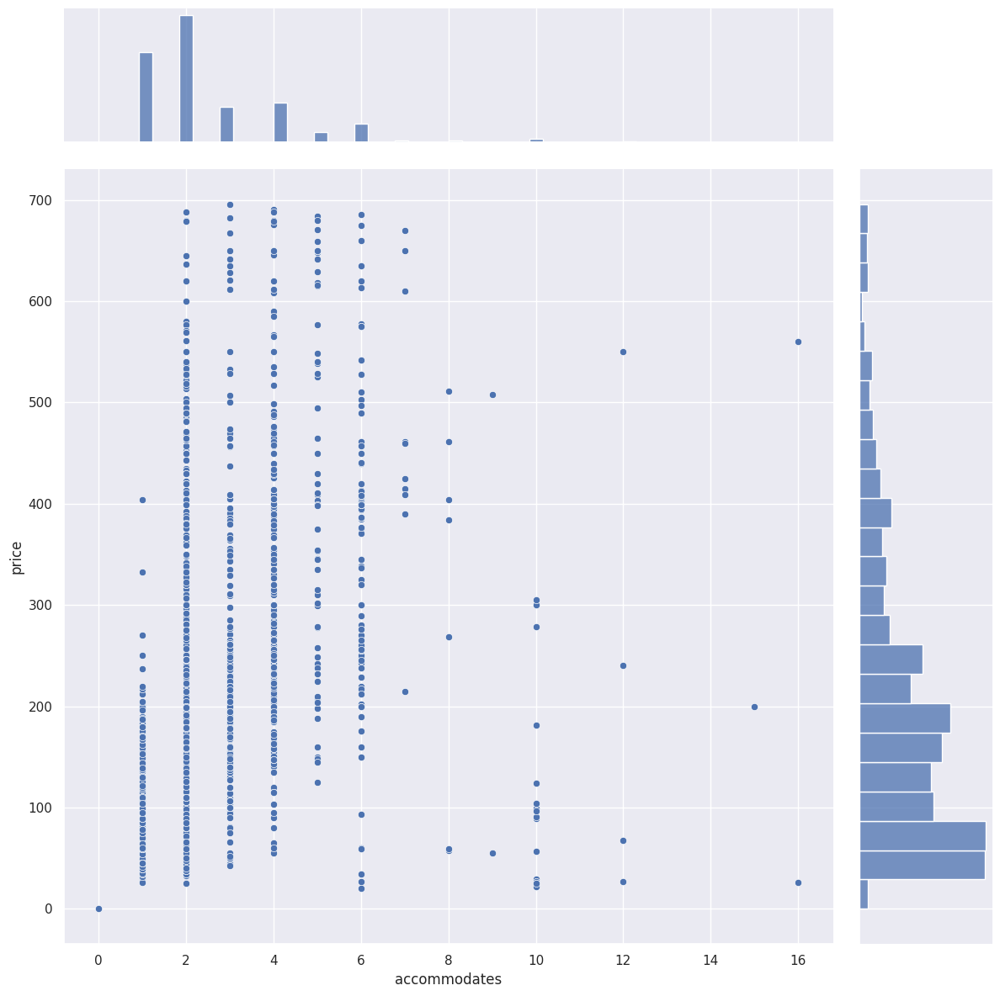

In [127]:
sb.jointplot(data=accomodateVsPrice,x="accommodates", y="price", height =12)

In [128]:
accomodateVsPrice.corr()

,accommodates,price
accommodates,1.000000,0.451323
price,0.451323,1.000000


<Axes: >

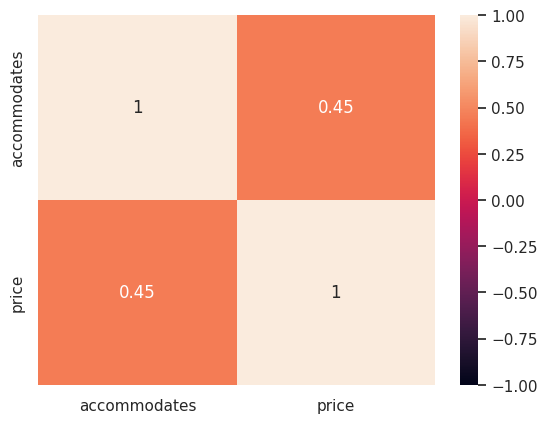

In [129]:
#Plot heatmap of corr
sb.heatmap(accomodateVsPrice.corr(), annot=True, vmin = -1.0, vmax = 1.0)

---
## 6. Amenities vs Price

In [130]:
amenitiesDF = pd.DataFrame(airDF["amenities"])
priceDF = pd.DataFrame(airDF["price"])
amenitiesDF

,amenities
0,"[Cooking basics, Refrigerator, Kitchen, Hair d..."
1,"[Cooking basics, Heating, Kitchen, Hair dryer,..."
2,"[Air conditioning, Shampoo, Smoke alarm, Long ..."
3,"[Air conditioning, Shampoo, Smoke alarm, Long ..."
4,"[Cooking basics, Kitchen, Private entrance, Ha..."
...,...
2275,"[Air conditioning, Fire extinguisher, Security..."
2276,"[Air conditioning, Fire extinguisher, Security..."
2277,"[Air conditioning, Fire extinguisher, Security..."
2278,"[First aid kit, Heating, Refrigerator, Hair dr..."


In [131]:
amenitiesDF.describe()

,amenities
count,2280
unique,1718
top,"[Cooking basics, Heating, Refrigerator, Kitche..."
freq,46


In [132]:
no_amenitiesDF = pd.DataFrame(airDF["no_amenities"])
no_amenitiesDF

,no_amenities
0,28
1,24
2,17
3,18
4,31
...,...
2275,8
2276,8
2277,8
2278,39


In [133]:
no_amenitiesDF.describe()

,no_amenities
count,2280.000000
mean,24.685965
std,10.186440
min,2.000000
25%,17.000000
50%,25.000000
75%,31.000000
max,63.000000


<Axes: xlabel='no_amenities', ylabel='Count'>

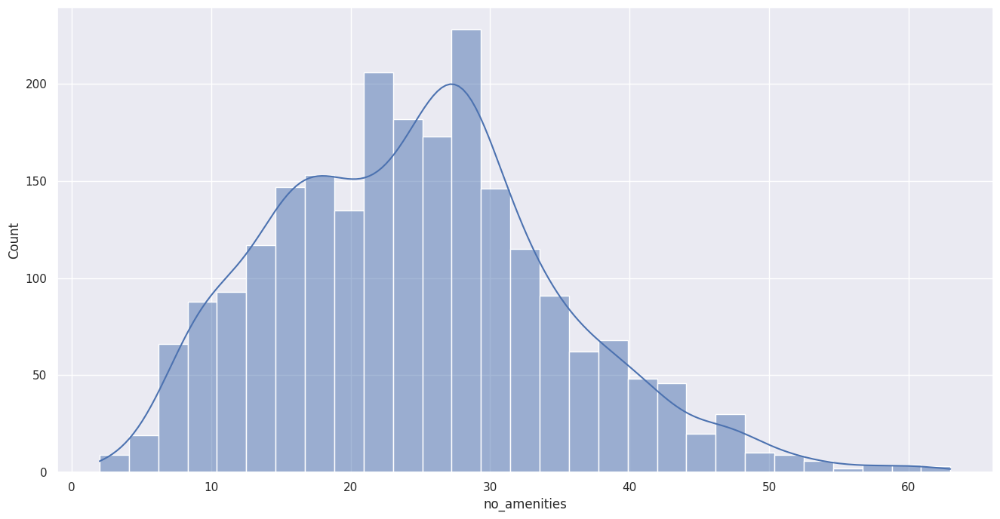

In [134]:
f = plt.figure(figsize=(16,8))
sb.histplot(data = airDF["no_amenities"], kde = True)

In [135]:
#concatenate price and accomodate
amenitiesVsPrice = pd.concat([no_amenitiesDF,priceDF], axis = 1)
amenitiesVsPrice

,no_amenities,price
0,28,81
1,24,81
2,17,52
3,18,49
4,31,175
...,...,...
2275,8,45
2276,8,45
2277,8,186
2278,39,797


In [136]:
print(amenitiesVsPrice.isna().sum())

no_amenities    0
price           0
dtype: int64


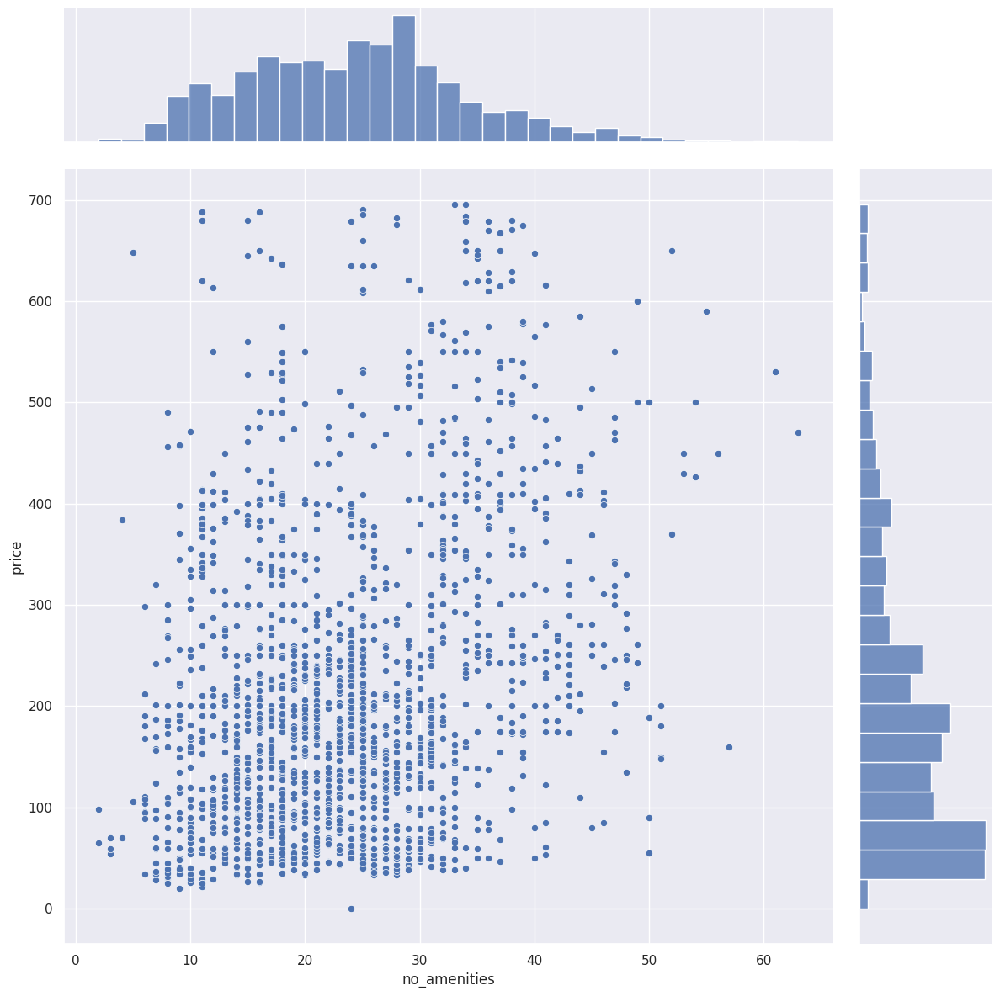

In [137]:
amenitiesVsPrice = removeOutliers(amenitiesVsPrice,"price")
sb.jointplot(data=amenitiesVsPrice,x="no_amenities", y="price", height =12)

In [138]:
amenitiesCorr = amenitiesVsPrice.corr()

<Axes: >

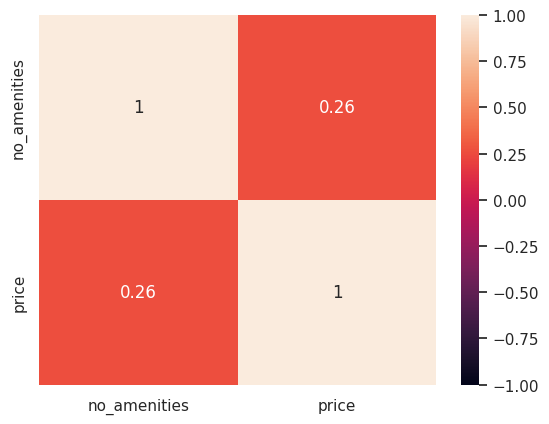

In [139]:
sb.heatmap(amenitiesCorr, annot=True, vmin = -1.0, vmax = 1.0)


---
## 7. number_of_reviews vs price

In [140]:
numberOfReviewsDF = pd.DataFrame(airDF["number_of_reviews"])
priceDF = pd.DataFrame(airDF['price'])
numberOfReviewsDF

,number_of_reviews
0,24.0
1,47.0
2,22.0
3,14.0
4,12.0
...,...
2275,0.0
2276,0.0
2277,0.0
2278,0.0


In [141]:
numberOfReviewsDF.describe()

,number_of_reviews
count,2280.000000
mean,9.852632
std,28.571277
min,0.000000
25%,0.000000
50%,1.000000
75%,5.000000
max,361.000000


<Axes: >

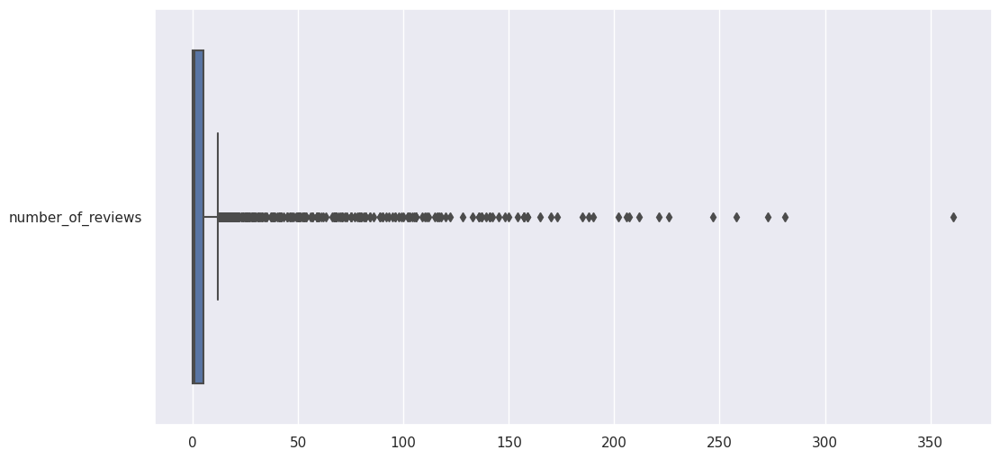

In [142]:
f = plt.figure(figsize=(12,6))
sb.boxplot(data = numberOfReviewsDF , orient = 'h')

we can see that there are alot of outliers in number_of_reviews, we might not be able to draw any meaningful conclusion from this feature. hence, We will perform bivariate EDA where we use number_of_reviews as a predictor and price as a response to see if we can come up with something.

In [143]:
reviewsVsPrice = pd.concat([numberOfReviewsDF,priceDF], axis = 1)
reviewsVsPrice

,number_of_reviews,price
0,24.0,81
1,47.0,81
2,22.0,52
3,14.0,49
4,12.0,175
...,...,...
2275,0.0,45
2276,0.0,45
2277,0.0,186
2278,0.0,797


<Axes: >

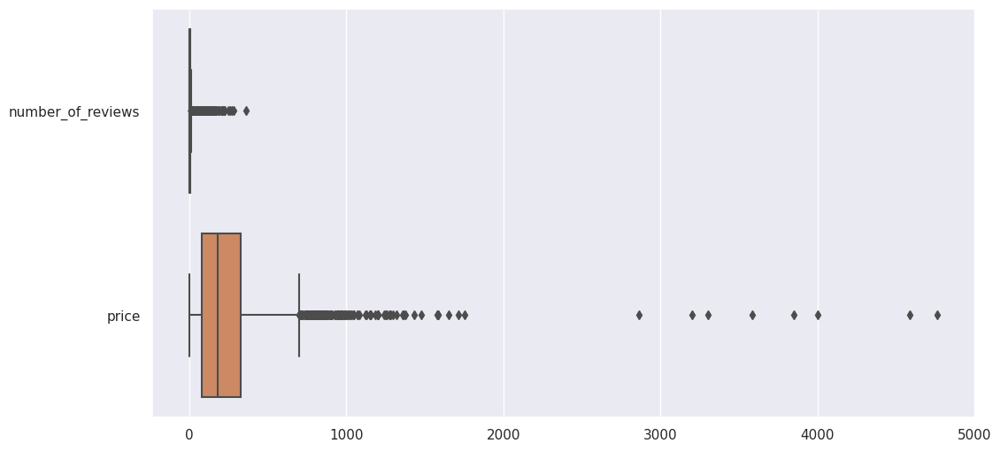

In [144]:
f = plt.figure(figsize=(12,6))
sb.boxplot(data = reviewsVsPrice , orient = 'h')

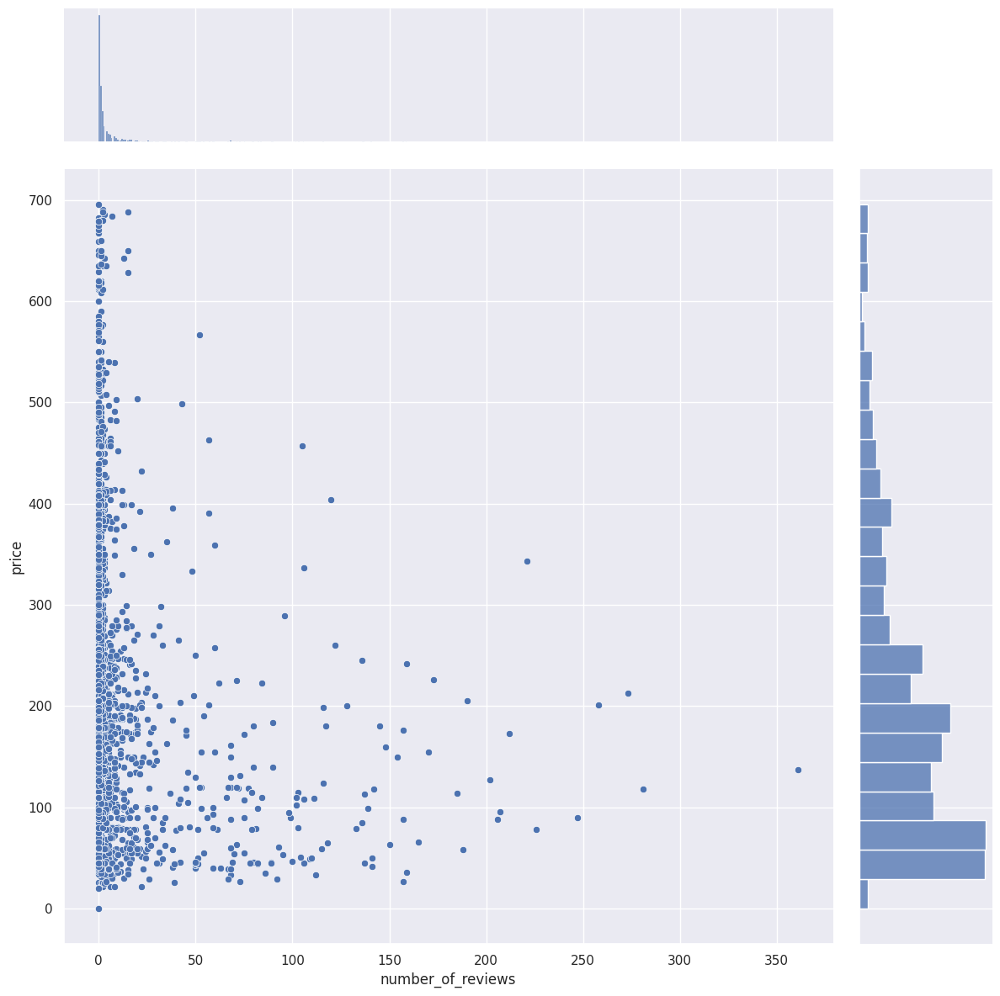

In [145]:
reviewsVsPrice= removeOutliers(reviewsVsPrice,"price")
sb.jointplot(data=reviewsVsPrice,x="number_of_reviews", y="price", height =12)

In [146]:
reviewsVsPrice.corr()

,number_of_reviews,price
number_of_reviews,1.000000,-0.137133
price,-0.137133,1.000000


## lets try to remove the outliers and replot to see if anything changes

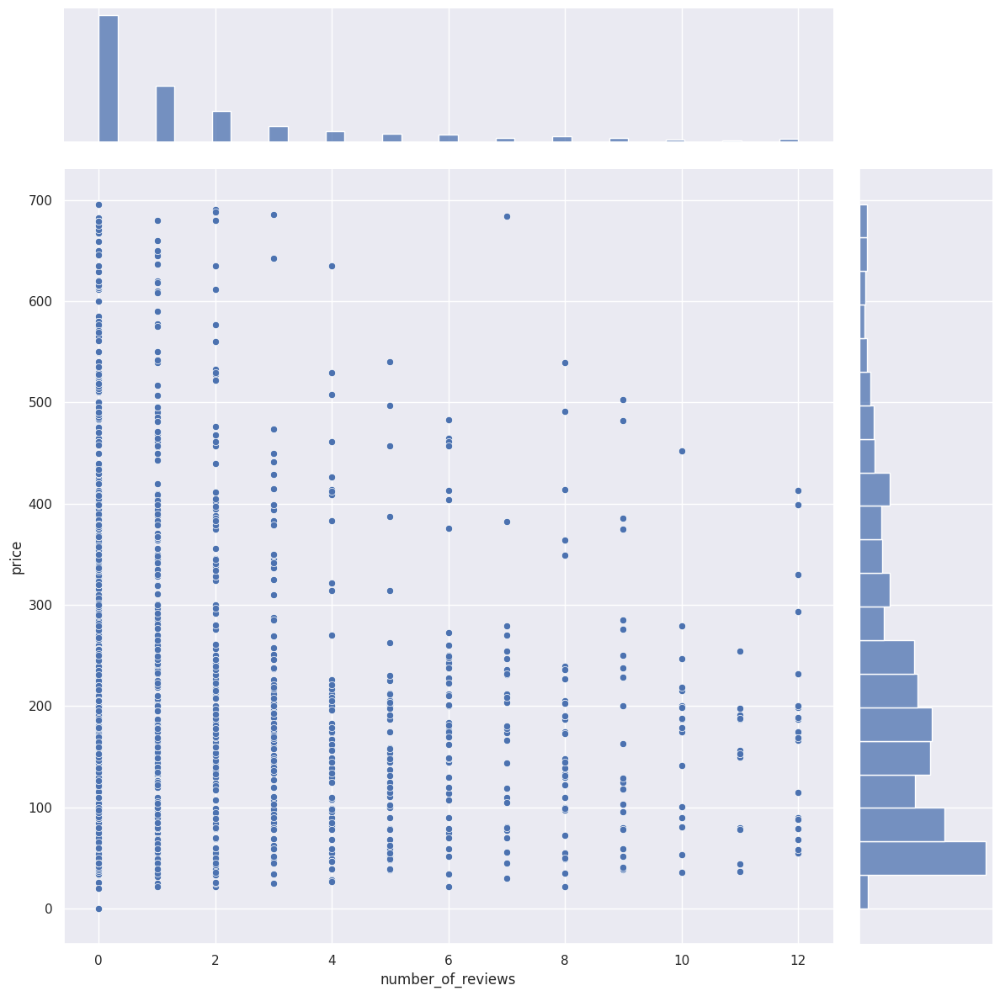

In [147]:
reviewsVsPriceCleaned = removeOutliers(reviewsVsPrice , "number_of_reviews")
sb.jointplot(data=reviewsVsPriceCleaned,x="number_of_reviews", y="price", height =12)

In [148]:
corr1 = reviewsVsPrice.corr()
corr2 = reviewsVsPriceCleaned.corr()
print(corr1)
print()
print(corr2)

                   number_of_reviews     price
number_of_reviews           1.000000 -0.137133
price                      -0.137133  1.000000

                   number_of_reviews     price
number_of_reviews           1.000000 -0.121736
price                      -0.121736  1.000000


Text(0.5, 1.0, 'Without Outliers')

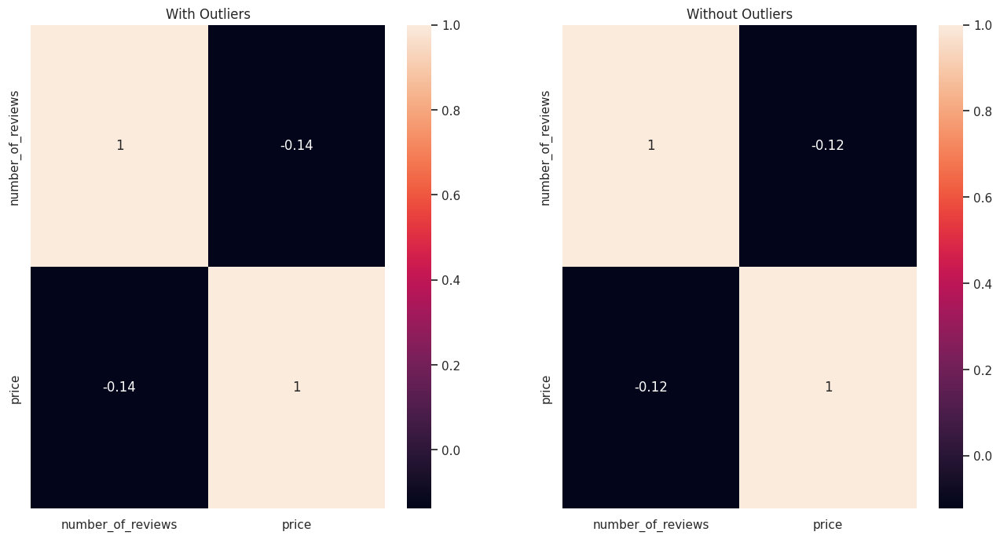

In [149]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
sb.heatmap(corr1, annot = True , ax=axs[0])
axs[0].set_title('With Outliers')
sb.heatmap(corr2, annot = True , ax=axs[1])
axs[1].set_title('Without Outliers')

 Even after we removed outliers, the correlation remain the same for both datasets. This suggest that the outliers are not affecting the correlation coefficient significantly, and this variable is not a good indicator in trying to predict our price value.

---
# Multivariate EDA

#UPDATE 

1. i updated the string replace, so its not cluttered together like before
2. i removed the outliers based on the 'price' column -> accomodates is 0.45 now
3. i dont think the heading is right, unless we wanna compare amenities to price only

In [292]:
from sklearn.preprocessing import MultiLabelBinarizer
new_DF = pd.DataFrame(airDF)
amenitiesDF = new_DF['amenities'].astype(str)
amenities = amenitiesDF.str.replace('[{}"]', '').str.split(',')

mlb = MultiLabelBinarizer()
amenities_encoded = mlb.fit_transform(amenities)
amenities_df = pd.DataFrame(amenities_encoded, columns=mlb.classes_)
new_DF = amenities_df.join(new_DF)

#we remove the price outliers before heatmap
new_DF = removeOutliers(new_DF,"price")
corr_matrix = new_DF.corr().loc[:, 'price'].sort_values(ascending=False)
# Print the top 10 amenities that are most positively correlated with price
print(corr_matrix)


<ipython-input-292-537d94f123fb>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  amenities = amenitiesDF.str.replace('[{}"]', '').str.split(',')
<ipython-input-292-537d94f123fb>:13: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = new_DF.corr().loc[:, 'price'].sort_values(ascending=False)


price                                1.000000
accommodates                         0.451323
 'Bathtub'                           0.359807
 'Cleaning available during stay'    0.332673
 'Gym'                               0.329792
                                       ...   
 'Keypad'                           -0.291968
minimum_nights                      -0.418836
 'Lock on bedroom door'             -0.451324
 'Wifi']                                  NaN
['Exercise equipment'                     NaN
Name: price, Length: 176, dtype: float64


<ipython-input-195-5533e0a94caf>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = new_DF.corr()


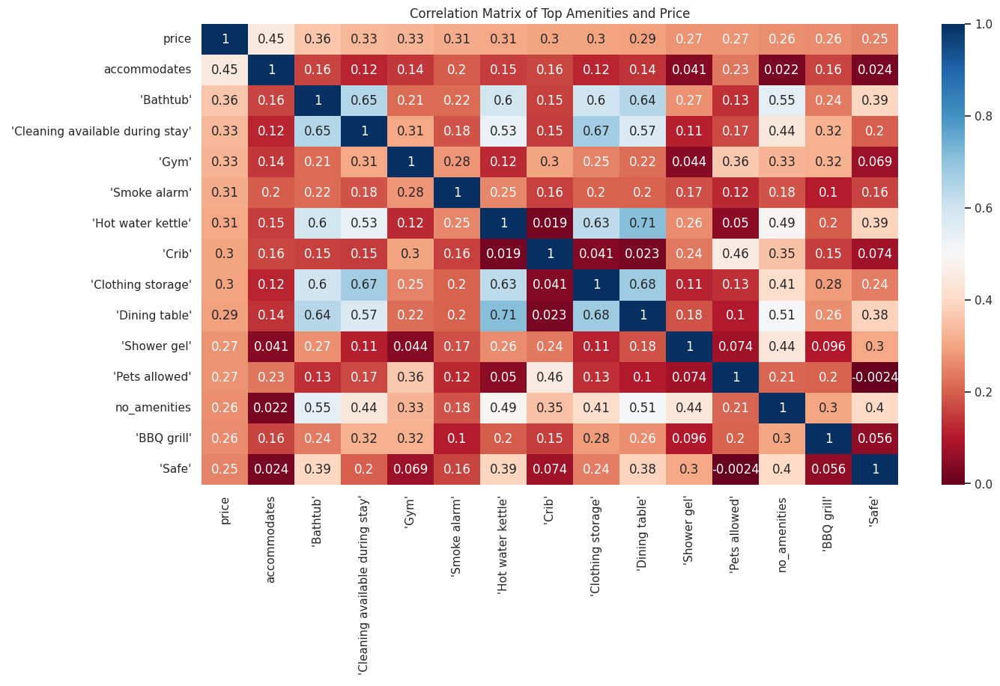

In [195]:
# Calculate the correlation matrix between all columns in the DataFrame
corr_matrix = new_DF.corr()

# Select the top 10 amenities that are most positively correlated with price
top_amenities = corr_matrix['price'].sort_values(ascending=False).head(15).index

# Create a subset of the correlation matrix with only the top amenities and price columns
subset_corr_matrix = corr_matrix.loc[top_amenities, top_amenities]
# Set the figure size
plt.figure(figsize=(15, 8))
# Create a heatmap of the subset correlation matrix
sb.heatmap(subset_corr_matrix, annot=True,cmap = "RdBu")
plt.title('Correlation Matrix of Top Amenities and Price')
plt.show()

---

In [293]:
#make a copy of our main dataframe
newDF = pd.DataFrame(airDF[["neighbourhood_cleansed","neighbourhood_group_cleansed","property_type","price"]])
#Classify according to their first word up to the space
propertyTypeDF = pd.DataFrame(newDF["property_type"])
count = 0
for x in newDF["property_type"]:
    #Split this
    s = newDF["property_type"].iloc[count].split(" ", 1)[0]
    if s == "Private":
      s = "Private room"
    elif s == "Entire":
      s = "Entire home/apt"
    elif s == "Room":
      s= "Hotel/Hostel"
    elif s == "Shared":
      s= "Shared room"
    newDF["property_type"].iloc[count] = s
    count += 1
#we print out the values to check if its cleaned properly
newDF["property_type"]

<ipython-input-293-e4c00dc2f244>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newDF["property_type"].iloc[count] = s


0       Private room
1       Private room
2       Private room
3       Private room
4       Private room
            ...     
2275     Shared room
2276     Shared room
2277    Private room
2278    Hotel/Hostel
2279    Hotel/Hostel
Name: property_type, Length: 2280, dtype: object

In [294]:
''' from sklearn.preprocessing import MultiLabelBinarizer

potential_cols = ["neighbourhood_cleansed","neighbourhood_group_cleansed","property_type"]
potentialDF = newDF[potential_cols]

mlb = MultiLabelBinarizer()
potential_encoded = mlb.fit_transform(potentialDF)
potentialDF = pd.DataFrame(potential_encoded, columns=mlb.classes_)
potentialDF = potentialDF.join(new_DF["price"])

#we remove the price outliers before heatmap
potentialDF = removeOutliers(potentialDF,"price")
corr_matrix = potentialDF.corr().loc[:, 'price'].sort_values(ascending=False)
# Print the top 10 amenities that are most positively correlated with price
print(corr_matrix) '''


' from sklearn.preprocessing import MultiLabelBinarizer\n\npotential_cols = ["neighbourhood_cleansed","neighbourhood_group_cleansed","property_type"]\npotentialDF = newDF[potential_cols]\n\nmlb = MultiLabelBinarizer()\npotential_encoded = mlb.fit_transform(potentialDF)\npotentialDF = pd.DataFrame(potential_encoded, columns=mlb.classes_)\npotentialDF = potentialDF.join(new_DF["price"])\n\n#we remove the price outliers before heatmap\npotentialDF = removeOutliers(potentialDF,"price")\ncorr_matrix = potentialDF.corr().loc[:, \'price\'].sort_values(ascending=False)\n# Print the top 10 amenities that are most positively correlated with price\nprint(corr_matrix) '

In [295]:
from sklearn.preprocessing import OneHotEncoder
potentialDF = newDF[["neighbourhood_cleansed","neighbourhood_group_cleansed","property_type","price"]]
potential_cols = ["neighbourhood_cleansed","neighbourhood_group_cleansed","property_type"]

newDF_encoded = pd.get_dummies(potentialDF, columns=potential_cols)
#remove price outliers
newDF_encoded = removeOutliers(newDF_encoded,"price")


corr_matrix = newDF_encoded.corr().loc[:, 'price'].sort_values(ascending=False)
print(corr_matrix)

price                                             1.000000
property_type_Entire home/apt                     0.533611
neighbourhood_cleansed_Orchard                    0.177916
neighbourhood_cleansed_Queenstown                 0.162332
neighbourhood_cleansed_Clementi                   0.135881
neighbourhood_cleansed_Southern Islands           0.133302
neighbourhood_cleansed_Tanglin                    0.101186
neighbourhood_cleansed_River Valley               0.096555
neighbourhood_cleansed_Novena                     0.095289
neighbourhood_cleansed_Marina South               0.071011
property_type_Hotel/Hostel                        0.070412
neighbourhood_cleansed_Singapore River            0.060460
neighbourhood_group_cleansed_Central Region       0.058294
neighbourhood_cleansed_Hougang                    0.055388
neighbourhood_cleansed_Central Water Catchment    0.047109
neighbourhood_cleansed_Newton                     0.034473
neighbourhood_group_cleansed_West Region          0.0225

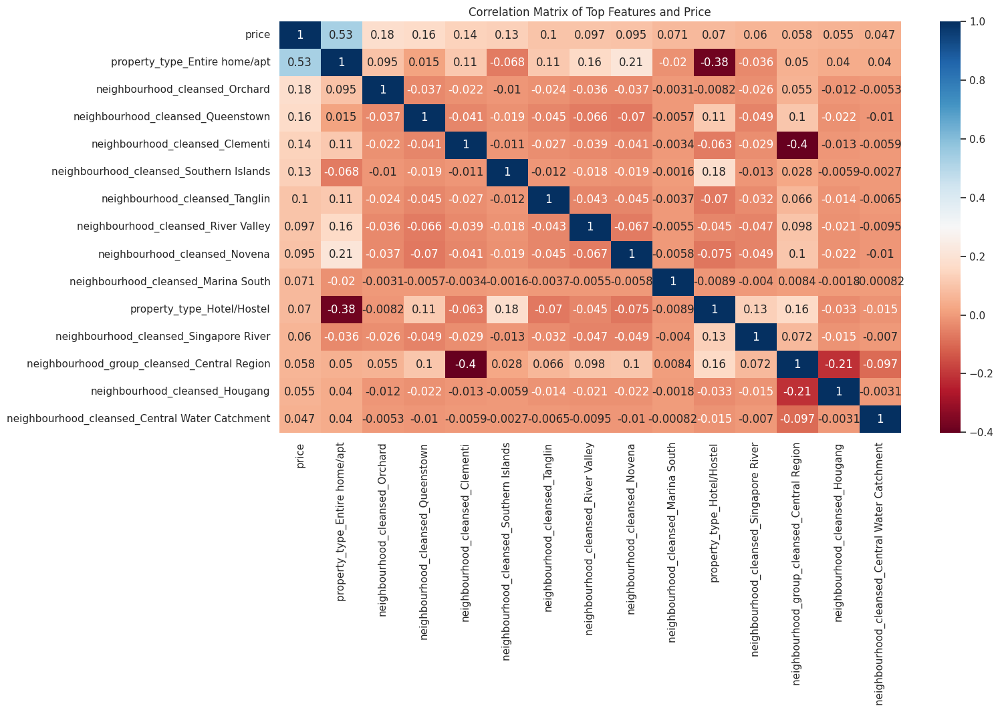

In [296]:
corr_matrix = newDF_encoded.corr()
# Select the top 10 amenities that are most positively correlated with price
top_features = corr_matrix['price'].sort_values(ascending=False).head(15).index

# Create a subset of the correlation matrix with only the top amenities and price columns
subset_corr_matrix = corr_matrix.loc[top_features,top_features]

# Set the figure size
plt.figure(figsize=(15, 8))

# Create a heatmap of the subset correlation matrix
sb.heatmap(subset_corr_matrix, annot=True,cmap = "RdBu")

plt.title('Correlation Matrix of Top Features and Price')
plt.show()